#### <b>Download the Dataset</b>

* The dataset contains approximately 13,000 Korean "human face" images.
* In this dataset, all faces are cropped to a resolution of 128 X 128 pixels, although some of the original images have been high resolution.
* Each image filename indicates which family (household) number it belongs to.

In [ ]:
%%capture
!wget https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EbMhBPnmIb5MutZvGicPKggBWKm5hLs0iwKfGW7_TwQIKg?download=1 -O custom_korean_family_dataset_resolution_128.zip
!unzip custom_korean_family_dataset_resolution_128.zip -d ./custom_korean_family_dataset_resolution_128

#### <b>Load Libraries</b>

* Load various useful python libraries for the experiments.

In [1]:
import os
import time
import random
import glob
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
from torchvision import datasets, transforms, models
import torchvision.transforms.functional as TF
import torch.nn.functional as F

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

from sklearn import linear_model, model_selection
import helpers

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


#### <b>Family Relationship Dataset</b>

1. It consists of a total of 900 households and approximately exact 13,068 individuals.
2. The last part of the filename, such as "a1", indicates the "age group".
  * This dataset consists of 8 age group classes.
  * The task is one of the 8-classes classification problem.
  * If we perform random guessing, the accuracy is approximately 12.5%.
3. The age classification problem is somewhat challenging, thus, we expect that our dataset will be helpful for evaluating the forgetting performance of a machine unlearning algorithm.
  * Our proposed setting has been configured in a way that is almost similar to the NeurIPS Kaggle Competition 2023 held on Kaggle.
4. We have utilized "Family Relationship Dataset" from AI Hub for constructing this dataset.
  * <b>Link</b>: https://www.aihub.or.kr/aihubdata/data/view.do?currMenu=&topMenu=&aihubDataSe=realm&dataSetSn=528

#### <b>Load Datasets 1</b>

* The following three datasets do not overlap at the household level.
  * Thus, our setting ensures any individual "subjects" are overlapped across the following three sub-dataset.
  * In other wrods, we set any person (subject) to do not simultaneously belonging to the $\mathcal{D}_{train}$, $\mathcal{D}_{test}$ and $\mathcal{D}_{unseen}$.
* <b>Training dataset $\mathcal{D}_{train}$</b>: (F0001 ~ F0299) folders have 10,025 images.
* <b>Test dataset $\mathcal{D}_{test}$</b>: (F0801 ~ F0850) folders have 1,539 images.
* <b>Unseen dataset $\mathcal{D}_{unseen}$</b>: (F0851 ~ F0900) folders have 1,504 images.

In [2]:
"""
> [Function] Parse the metadata.
* image_age_list[0] = ["F0001_AGE_D_18_a1.jpg"] = "a"
* image_age_list[1] = ["F0001_AGE_D_18_a2.jpg"] = "a"
* image_age_list[2] = ["F0001_AGE_D_18_a3.jpg"] = "a"
* image_age_list[3] = ["F0001_AGE_D_18_a4.jpg"] = "a"
* image_age_list[4] = ["F0001_AGE_D_18_b1.jpg"] = "b"
...
"""
def parsing(meta_data):
    image_age_list = []
    # iterate all rows in the metadata file
    for idx, row in meta_data.iterrows():
        image_path = row['image_path']
        age_class = row['age_class']
        image_age_list.append([image_path, age_class])
    return image_age_list

In [3]:
class Dataset(Dataset):
    def __init__(self, meta_data, image_directory, transform=None, forget=False, retain=False):
        self.meta_data = meta_data
        self.image_directory = image_directory
        self.transform = transform

        # Process the metadata.
        image_age_list = parsing(meta_data)

        self.image_age_list = image_age_list
        self.age_class_to_label = {
            "a": 0, "b": 1, "c": 2, "d": 3, "e": 4, "f": 5, "g": 6, "h": 7
        }

        # After training the original model, we will do "machine unlearning".
        # The machine unlearning requires two datasets, ① forget dataset and ② retain dataset.
        # In this experiment, we set the first 1,500 images to be forgotten and the rest images to be retained.
        if forget:
            self.image_age_list = self.image_age_list[:1500]
        if retain:
            self.image_age_list = self.image_age_list[1500:]

    def __len__(self):
        return len(self.image_age_list)

    def __getitem__(self, idx):
        image_path, age_class = self.image_age_list[idx]
        img = Image.open(os.path.join(self.image_directory, image_path))
        label = self.age_class_to_label[age_class]

        if self.transform:
            img = self.transform(img)

        return img, label

In [4]:
label_to_age = {
    0: "0-6 years old",
    1: "7-12 years old",
    2: "13-19 years old",
    3: "20-30 years old",
    4: "31-45 years old",
    5: "46-55 years old",
    6: "56-66 years old",
    7: "67-80 years old"
}

train_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_train_dataset.csv"
train_meta_data = pd.read_csv(train_meta_data_path)
train_image_directory = "./custom_korean_family_dataset_resolution_128/train_images"

test_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_val_dataset.csv"
test_meta_data = pd.read_csv(test_meta_data_path)
test_image_directory = "./custom_korean_family_dataset_resolution_128/val_images"

unseen_meta_data_path = "./custom_korean_family_dataset_resolution_128/custom_test_dataset.csv"
unseen_meta_data = pd.read_csv(unseen_meta_data_path)
unseen_image_directory = "./custom_korean_family_dataset_resolution_128/test_images"

train_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.RandomHorizontalFlip(),
    transforms.RandomAffine(0, shear=10, scale=(0.8, 1.2)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor()
])

test_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

unseen_transform = transforms.Compose([
    transforms.Resize(128),
    transforms.ToTensor()
])

train_dataset = Dataset(train_meta_data, train_image_directory, train_transform)
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)

test_dataset = Dataset(test_meta_data, test_image_directory, test_transform)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False)

unseen_dataset = Dataset(unseen_meta_data, unseen_image_directory, unseen_transform)
unseen_dataloader = DataLoader(unseen_dataset, batch_size=64, shuffle=False)

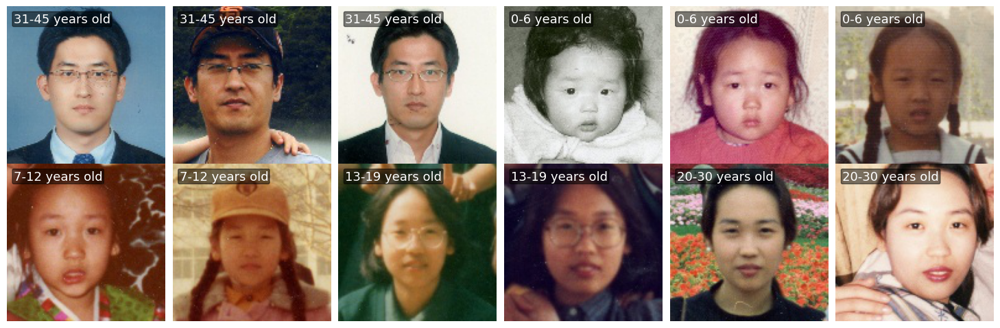

In [34]:
def show_images(images, labels, nrow=6, save_path=None):
    n_images = len(images)
    nrows = n_images // nrow + (n_images % nrow > 0)

    fig, axs = plt.subplots(nrows, nrow, figsize=(14.5, 2.3 * nrows), frameon=False)
    axs = axs.flatten() if n_images > 1 else [axs]

    for idx, (img, label) in enumerate(zip(images, labels)):
        ax = axs[idx]
        img_np = img.numpy().transpose((1, 2, 0))
        ax.imshow(img_np)
        ax.axis('off')

        ax.text(5, 5, label, color='white', fontsize=13,  ha='left', va='top',
                bbox=dict(facecolor='black', alpha=0.5, boxstyle='round,pad=0.1'))

    plt.tight_layout(pad=0)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)

    plt.show()

iterator = iter(test_dataloader)
imgs, labels = next(iterator)

label_strs = [label_to_age[label.item()] for label in labels[7:19]]

show_images(imgs[7:19], label_strs, nrow=6)

#### <b>Train the "Original Model"</b>

* Train the Original model to serve as the base model for performing Machine Unlearning

In [5]:
learning_rate = 0.01
log_step = 30

model = models.resnet18(pretrained=False)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 8)
model = model.cuda()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

In [6]:
def train():
    start_time = time.time()
    print(f'[Epoch: {epoch + 1} - Training]')
    model.train()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(train_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        outputs = model(imgs)
        optimizer.zero_grad()
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if i % log_step == log_step - 1:
            print(f'[Batch: {i + 1}] running train loss: {running_loss / total}, running train accuracy: {running_corrects / total}')

    print(f'train loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()


def test():
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(test_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

In [7]:
def adjust_learning_rate(optimizer, epoch):
    lr = learning_rate
    if epoch >= 10:
        lr /= 10
    if epoch >= 20:
        lr /= 10
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

num_original_epochs = 30
best_test_acc = 0
best_epoch = 0

In [8]:
history = []
accuracy = []
for epoch in range(num_original_epochs):
    adjust_learning_rate(optimizer, epoch)
    train_loss, train_acc = train()
    test_loss, test_acc = test()
    history.append((train_loss, test_loss))
    accuracy.append((train_acc, test_acc))

    if test_acc > best_test_acc:
        print("[Info] best test accuracy!")
        best_test_acc = test_acc
        best_epoch = epoch
        torch.save(model.state_dict(), f'best_checkpoint_epoch_{epoch + 1}.pth')

torch.save(model.state_dict(), f'last_checkpoint_epoch_{num_original_epochs}.pth')

[Epoch: 1 - Training]
[Batch: 30] running train loss: 0.03256314527243376, running train accuracy: 0.20520834624767303
[Batch: 60] running train loss: 0.03167366894582908, running train accuracy: 0.2252604216337204
[Batch: 90] running train loss: 0.03104935485041804, running train accuracy: 0.24149306118488312
[Batch: 120] running train loss: 0.030661766805375617, running train accuracy: 0.2506510615348816
[Batch: 150] running train loss: 0.030169793839255967, running train accuracy: 0.2632291615009308
train loss: 0.030059746613823563, accuracy: 0.2669326663017273
elapsed time: 67.64175271987915
[Test]
[Batch: 1] running test loss: 0.030868252739310265, running test accuracy: 0.296875
test loss: 0.030062958588454536, accuracy: 0.28654971718788147
elapsed time: 2.7077951431274414
[Info] best test accuracy!
[Epoch: 2 - Training]
[Batch: 30] running train loss: 0.026875852483014266, running train accuracy: 0.3552083373069763
[Batch: 60] running train loss: 0.026088203551868597, running tr

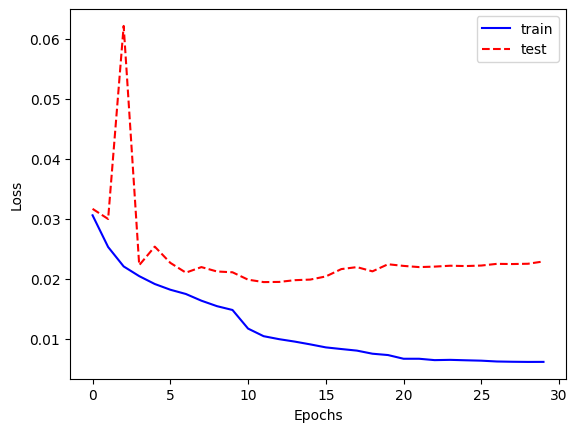

In [10]:
plt.plot([x[0] for x in history], 'b', label='train')
plt.plot([x[1] for x in history], 'r--',label='test')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

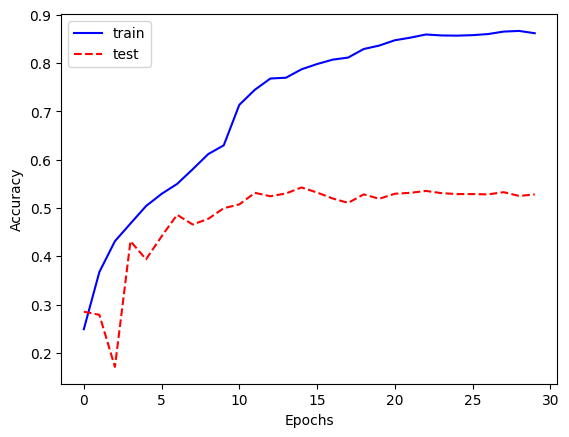

In [11]:
plt.plot([x[0] for x in accuracy], 'b', label='train')
plt.plot([x[1] for x in accuracy], 'r--',label='test')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

#### <b>(Option) Load the Pre-trained Original Model</b>

* We can easily download the pre-trained original model, rather than training the original model from scratch.
* <b>Download Link</b>: https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg

In [13]:
!wget https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg?download=1 -O pre_trained_last_checkpoint_epoch_30.pth

--2023-11-08 01:46:19--  https://postechackr-my.sharepoint.com/:u:/g/personal/dongbinna_postech_ac_kr/EfNlaO0X8_1Ij4WPPLs09cgBQl3WB_y7zNTNwvRvIn2CDg?download=1
Resolving postechackr-my.sharepoint.com (postechackr-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8fa::10, ...
Connecting to postechackr-my.sharepoint.com (postechackr-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/dongbinna_postech_ac_kr/Documents/Research/models/Machine%20Unlearning/last_checkpoint_epoch_30.pth?ga=1 [following]
--2023-11-08 01:46:20--  https://postechackr-my.sharepoint.com/personal/dongbinna_postech_ac_kr/Documents/Research/models/Machine%20Unlearning/last_checkpoint_epoch_30.pth?ga=1
Reusing existing connection to postechackr-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 44803358 (43M) [application/octet-stream]
Saving to: ‘pre_trained_last_checkpoint_epoch_30.pth’

pre_trained_last_ch 10

<b>Final Test</b>

In [8]:
model = models.resnet18(pretrained=False)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 8)
model = model.cuda()
# model_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
model_path = f'pre_trained_last_checkpoint_epoch_30.pth'
model.load_state_dict(torch.load(model_path))

test_loss, test_acc = test()
print("test loss:", test_loss)
print("test acc:", test_acc)

[Test]
[Batch: 1] running test loss: 0.023215655237436295, running test accuracy: 0.65625
test loss: 0.026597141599872035, accuracy: 0.5971410274505615
elapsed time: 5.443045616149902
test loss: 0.026597141599872035
test acc: 0.5971410274505615


#### <b> Train the "Retrained Model"</b>
* A model trained on only the retain dataset from scratch, excluding the forget dataset.
* This model can serve as a proxy ground-truth for calculating the potential ground-truth (1) model utility and (2) forgetting score.

#### <b>Load Datasets 2</b>

* In the NeurIPS Competition setting, when performing machine unlearning, training is done with 'retain' and 'forget', so augmentation can be applied. However, it should never be applied during evaluation.
* We divide training dataset $\mathcal{D}_{train}$ into a retain dataset $\mathcal{D}_{retain}$ and a forget dataset $\mathcal{D}_{forget}$.

In [8]:
forget_dataset_train = Dataset(train_meta_data, train_image_directory, train_transform, forget=True)
forget_dataloader_train = DataLoader(forget_dataset_train, batch_size=64, shuffle=True)

retain_dataset_train = Dataset(train_meta_data, train_image_directory, train_transform, retain=True)
retain_dataloader_train = DataLoader(retain_dataset_train, batch_size=64, shuffle=True)

forget_dataset_test = Dataset(train_meta_data, train_image_directory, test_transform, forget=True)
forget_dataloader_test = DataLoader(forget_dataset_test, batch_size=64, shuffle=False)

retain_dataset_test = Dataset(train_meta_data, train_image_directory, test_transform, retain=True)
retain_dataloader_test = DataLoader(retain_dataset_test, batch_size=64, shuffle=False)

In [9]:
print('Train dataset size:', len(train_dataset))
print('Test dataset size:', len(test_dataset))
print('Forget dataset size:', len(forget_dataset_train))
print('Retain dataset size:', len(retain_dataset_train))
print('Unseen dataset size:', len(unseen_dataset))

Train dataset size: 10025
Test dataset size: 1539
Forget dataset size: 1500
Retain dataset size: 8525
Unseen dataset size: 1504


In [10]:
# Checking for duplicates across datasets
train_image_paths = [x[0] for x in train_dataset.image_age_list]
test_image_paths = [x[0] for x in test_dataset.image_age_list]
forget_image_paths = [x[0] for x in forget_dataset_train.image_age_list]
retain_image_paths = [x[0] for x in retain_dataset_train.image_age_list]
unseen_image_paths = [x[0] for x in unseen_dataset.image_age_list]

train_test_overlap = len(set(train_image_paths) & set(test_image_paths))
train_forget_overlap = len(set(train_image_paths) & set(forget_image_paths))
train_retain_overlap = len(set(train_image_paths) & set(retain_image_paths))
train_unseen_overlap = len(set(train_image_paths) & set(unseen_image_paths))
test_forget_overlap = len(set(test_image_paths) & set(forget_image_paths))
test_retain_overlap = len(set(test_image_paths) & set(retain_image_paths))
test_unseen_overlap = len(set(test_image_paths) & set(unseen_image_paths))
forget_retain_overlap = len(set(forget_image_paths) & set(retain_image_paths))
forget_unseen_overlap = len(set(forget_image_paths) & set(unseen_image_paths))
retain_unseen_overlap = len(set(retain_image_paths) & set(unseen_image_paths))

overlap_dict = {
    'train_test': train_test_overlap,
    'train_forget': train_forget_overlap,
    'train_retain': train_retain_overlap,
    'train_unseen': train_unseen_overlap,
    'test_forget': test_forget_overlap,
    'test_retain': test_retain_overlap,
    'test_unseen': test_unseen_overlap,
    'forget_retain': forget_retain_overlap,
    'forget_unseen': forget_unseen_overlap,
    'retain_unseen': retain_unseen_overlap
}
overlap_dict

{'train_test': 0,
 'train_forget': 1500,
 'train_retain': 8525,
 'train_unseen': 0,
 'test_forget': 0,
 'test_retain': 0,
 'test_unseen': 0,
 'forget_retain': 0,
 'forget_unseen': 0,
 'retain_unseen': 0}

In [11]:
@torch.no_grad()
def evaluation(model, data_loader):
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0
    running_top2_corrects = 0

    for i, batch in enumerate(data_loader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Top-2 accuracy.
            _, top2_preds = outputs.topk(2, dim=1)  # Get the top 2 class indices.
            top2_correct = top2_preds.eq(labels.view(-1, 1).expand_as(top2_preds))
            running_top2_corrects += top2_correct.any(dim=1).sum().item()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data).item()

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}, running top-2 accuracy: {running_top2_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}, top-2 accuracy: {running_top2_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return {'Loss': running_loss / total, 'Acc': running_corrects / total, 'Top-2 Acc': running_top2_corrects / total}

def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    random.seed(seed)

In [12]:
def compute_losses(net, loader):
    criterion = nn.CrossEntropyLoss(reduction="none")
    all_losses = []

    for inputs, y in loader:
        targets = y
        inputs, targets = inputs.cuda(), targets.cuda()

        logits = net(inputs)

        losses = criterion(logits, targets).cpu().detach().numpy()
        for l in losses:
            all_losses.append(l)

    return np.array(all_losses)

def simple_mia(sample_loss, members, n_splits=10, random_state=0):
    unique_members = np.unique(members)
    if not np.all(unique_members == np.array([0, 1])):
        raise ValueError("members should only have 0 and 1s")

    attack_model = linear_model.LogisticRegression()
    cv = model_selection.StratifiedShuffleSplit(
        n_splits=n_splits, random_state=random_state
    )
    return model_selection.cross_val_score(
        attack_model, sample_loss, members, cv=cv, scoring="accuracy"
    )

def cal_mia(model):
    set_seed(42)

    forget_losses = compute_losses(model, forget_dataloader_test)
    unseen_losses = compute_losses(model, unseen_dataloader)

    np.random.shuffle(forget_losses)
    forget_losses = forget_losses[: len(unseen_losses)]

    samples_mia = np.concatenate((unseen_losses, forget_losses)).reshape((-1, 1))
    labels_mia = [0] * len(unseen_losses) + [1] * len(forget_losses)

    mia_scores = simple_mia(samples_mia, labels_mia)
    forgetting_score = abs(0.5 - mia_scores.mean())

    return {'MIA': mia_scores.mean(), 'Forgeting Score': forgetting_score}

In [13]:
# Adding KL-divergence as a new metric for unlearning

def compute_kl_divergence(model1, model2, dataloader):
    model1.eval()
    model2.eval()
    total_kl_div = 0.0

    with torch.no_grad():
        for inputs, _ in dataloader:
            inputs = inputs.to(DEVICE)
            log_probs1 = F.log_softmax(model1(inputs), dim=1)
            probs2 = F.softmax(model2(inputs), dim=1)
            kl_div = F.kl_div(log_probs1, probs2, reduction='batchmean')
            total_kl_div += kl_div.item() * inputs.size(0)

    return total_kl_div / len(dataloader.dataset)


In [14]:
def train_model_using_only_retrain(model):
    start_time = time.time()
    print(f'[Epoch: {epoch + 1} - Training]')
    model.train()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(retain_dataloader_train):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        outputs = model(imgs)
        optimizer.zero_grad()
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if i % log_step == log_step - 1:
            print(f'[Batch: {i + 1}] running train loss: {running_loss / total}, running train accuracy: {running_corrects / total}')

    print(f'train loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

def test_model(model):
    start_time = time.time()
    print(f'[Test]')
    model.eval()
    total = 0
    running_loss = 0.0
    running_corrects = 0

    for i, batch in enumerate(test_dataloader):
        imgs, labels = batch
        imgs, labels = imgs.cuda(), labels.cuda()

        with torch.no_grad():
            outputs = model(imgs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        total += labels.shape[0]
        running_loss += loss.item()
        running_corrects += torch.sum(preds == labels.data)

        if (i == 0) or (i % log_step == log_step - 1):
            print(f'[Batch: {i + 1}] running test loss: {running_loss / total}, running test accuracy: {running_corrects / total}')

    print(f'test loss: {running_loss / total}, accuracy: {running_corrects / total}')
    print("elapsed time:", time.time() - start_time)
    return running_loss / total, (running_corrects / total).item()

def adjust_learning_rate(optimizer, epoch):
    lr = learning_rate
    if epoch >= 10:
        lr /= 10
    if epoch >= 20:
        lr /= 10
    for param_group in optimizer.param_groups:
        param_group['lr'] = lr

In [25]:
set_seed(42)

num_epochs = 30
best_test_acc = 0
best_epoch = 0
learning_rate = 0.01

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model = retrained_model.cuda()
criterion = nn.CrossEntropyLoss()

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(retrained_model.parameters(), lr=learning_rate, momentum=0.9)

history = []
accuracy = []
for epoch in range(num_epochs):
    adjust_learning_rate(optimizer, epoch)
    train_loss, train_acc = train_model_using_only_retrain(retrained_model)
    test_loss, test_acc = test_model(retrained_model)
    history.append((train_loss, test_loss))
    accuracy.append((train_acc, test_acc))

    if test_acc > best_test_acc:
        print("[Info] best test accuracy!")
        best_test_acc = test_acc
        best_epoch = epoch

torch.save(retrained_model.state_dict(), 'retrained_model_weights.pth')

[Epoch: 1 - Training]
[Batch: 30] running train loss: 0.03223163317888975, running train accuracy: 0.1979166716337204
[Batch: 60] running train loss: 0.0315173527225852, running train accuracy: 0.22343751788139343
[Batch: 90] running train loss: 0.031074790904919308, running train accuracy: 0.23802083730697632
[Batch: 120] running train loss: 0.030700470491622885, running train accuracy: 0.25247398018836975
train loss: 0.030608366577506416, accuracy: 0.25724339485168457
elapsed time: 42.49017333984375
[Test]
[Batch: 1] running test loss: 0.035480108112096786, running test accuracy: 0.15625
test loss: 0.0358726380319081, accuracy: 0.20922677218914032
elapsed time: 3.072519540786743
[Info] best test accuracy!
[Epoch: 2 - Training]
[Batch: 30] running train loss: 0.027835655088226, running train accuracy: 0.31718751788139343
[Batch: 60] running train loss: 0.027566483647873005, running train accuracy: 0.33151042461395264
[Batch: 90] running train loss: 0.026680200174450875, running train 

In [64]:
# Performance
test_acc = evaluation(retrained_model, test_dataloader)
unseen_acc = evaluation(retrained_model, unseen_dataloader)
mia = cal_mia(retrained_model.cuda())
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print()
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')

[Test]


[Batch: 1] running test loss: 0.024220062419772148, running test accuracy: 0.546875, running top-2 accuracy: 0.765625
test loss: 0.023909599925109982, accuracy: 0.4996751137102014, top-2 accuracy: 0.7569850552306693
elapsed time: 3.586869239807129
[Test]
[Batch: 1] running test loss: 0.018010780215263367, running test accuracy: 0.546875, running top-2 accuracy: 0.828125
test loss: 0.02084659329278672, accuracy: 0.5605053191489362, top-2 accuracy: 0.807845744680851
elapsed time: 3.5209555625915527
Test Acc: {'Loss': 0.023909599925109982, 'Acc': 0.4996751137102014, 'Top-2 Acc': 0.7569850552306693}
Unseen Acc: {'Loss': 0.02084659329278672, 'Acc': 0.5605053191489362, 'Top-2 Acc': 0.807845744680851}
MIA: {'MIA': 0.5365448504983388, 'Forgeting Score': 0.03654485049833878}

Final Score: 0.7132927063567619


#### <b>Machine Unlearning Experiments</b>

* In the NeurIPS Competition setting, when performing machine unlearning, training is done with 'retain' and 'forget', so augmentation can be applied. However, it should never be applied during evaluation.

<b>Original Model Preformance</b>

In [46]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
original_model = models.resnet18(pretrained=False)
num_features = original_model.fc.in_features
original_model.fc = nn.Linear(num_features, 8)
original_model.load_state_dict(torch.load(original_save_path))
original_model = original_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(original_model, test_dataloader)
test_acc

set_seed(42)

# Performance
test_acc = evaluation(original_model, test_dataloader)
unseen_acc = evaluation(original_model, unseen_dataloader)
mia = cal_mia(original_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, original_model, forget_dataloader_test)
                            
print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.023215655237436295, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.026597141599872035, accuracy: 0.5971410006497726, top-2 accuracy: 0.8856400259909032
elapsed time: 3.274925470352173
[Test]
[Batch: 1] running test loss: 0.023215655237436295, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.026597141599872035, accuracy: 0.5971410006497726, top-2 accuracy: 0.8856400259909032
elapsed time: 2.929360866546631
[Test]
[Batch: 1] running test loss: 0.01917770877480507, running test accuracy: 0.640625, running top-2 accuracy: 0.953125
test loss: 0.021293995347111783, accuracy: 0.6549202127659575, top-2 accuracy: 0.9002659574468085
elapsed time: 10.325754165649414

Test Acc: {'Loss': 0.026597141599872035, 'Acc': 0.5971410006497726, 'Top-2 Acc': 0.8856400259909032}
Unseen Acc: {'Loss': 0.021293995347111783, 'Acc': 0.6549202127659575, 'Top-2 Acc': 0.9002659574468085}
MIA: {'MIA': 0.7116279069767442, 'Fo

#### <b>Fine-Tuning</b>
* A method where the original model undergoes further training solely on the retain dataset.
* This approach aims to reinforce the model's knowledge of the retain dataset, potentially leading to the forgetting of the previously learned forget dataset.

In [19]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(unlearned_model, test_dataloader)
test_acc

[Test]
[Batch: 1] running test loss: 0.023215655237436295, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.026597141599872035, accuracy: 0.5971410006497726, top-2 accuracy: 0.8856400259909032
elapsed time: 3.351766347885132


{'Loss': 0.026597141599872035,
 'Acc': 0.5971410006497726,
 'Top-2 Acc': 0.8856400259909032}

In [20]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: 0.0692
Epoch [1/2], Batch [2/134] - Batch Loss: 0.0781
Epoch [1/2], Batch [3/134] - Batch Loss: 0.1503
Epoch [1/2], Batch [4/134] - Batch Loss: 0.0942
Epoch [1/2], Batch [5/134] - Batch Loss: 0.1309
Epoch [1/2], Batch [6/134] - Batch Loss: 0.0737
Epoch [1/2], Batch [7/134] - Batch Loss: 0.1348
Epoch [1/2], Batch [8/134] - Batch Loss: 0.1303
Epoch [1/2], Batch [9/134] - Batch Loss: 0.1624
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0676
Epoch [1/2], Batch [11/134] - Batch Loss: 0.0941
Epoch [1/2], Batch [12/134] - Batch Loss: 0.1867
Epoch [1/2], Batch [13/134] - Batch Loss: 0.0592
Epoch [1/2], Batch [14/134] - Batch Loss: 0.1548
Epoch [1/2], Batch [15/134] - Batch Loss: 0.0825
Epoch [1/2], Batch [16/134] - Batch Loss: 0.1539
Epoch [1/2], Batch [17/134] - Batch Loss: 0.1028
Epoch [1/2], Batch [18/134] - Batch Loss: 0.0364
Epoch [1/2], Batch [19/134] - Batch Loss: 0.0982
Epoch [1/2], Batch [20/134] - Batch Loss: 0.0573
Epoch [1/2], Batch [21/134] -

In [21]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)

print()
print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.023568948730826378, running test accuracy: 0.6875, running top-2 accuracy: 0.9375


test loss: 0.02781464388960751, accuracy: 0.603638726445744, top-2 accuracy: 0.8888888888888888
elapsed time: 4.014224290847778
[Test]
[Batch: 1] running test loss: 0.019277211278676987, running test accuracy: 0.6875, running top-2 accuracy: 0.953125
test loss: 0.022438213546225366, accuracy: 0.6529255319148937, top-2 accuracy: 0.8956117021276596
elapsed time: 3.241135835647583

Test Acc: {'Loss': 0.02781464388960751, 'Acc': 0.603638726445744, 'Top-2 Acc': 0.8888888888888888}
Unseen Acc: {'Loss': 0.022438213546225366, 'Acc': 0.6529255319148937, 'Top-2 Acc': 0.8956117021276596}
MIA: {'MIA': 0.7126245847176079, 'Forgeting Score': 0.21262458471760792}
Final Score: 0.589194778505264
KL-Div w.r.t Retrained model: 1.6582774928410848


#### <b>CF-k (Class-wise Forgetting)</b>
* A strategy that fine-tunes specific layers to make the model forget target data while retaining class structures.

In [15]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
cf_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [16]:
# Print a weight set of a front layer in the network to check the freezing.
print(unlearned_model.layer1[0].conv1.weight[0][0])

tensor([[ 0.0823, -0.0807, -0.0291],
        [-0.0787, -0.8153, -0.2380],
        [ 0.0615, -0.1015, -0.0267]], device='cuda:0',
       grad_fn=<SelectBackward0>)


In [17]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, unlearned_model.parameters()), lr=0.001)

# Freeze all the parameters.
for param in unlearned_model.parameters():
    param.requires_grad = False

# Only unfreeze the last three layers for the fine-tuning.
for param in unlearned_model.layer2.parameters():
    param.requires_grad = True
for param in unlearned_model.layer3.parameters():
    param.requires_grad = True
for param in unlearned_model.layer4.parameters():
    param.requires_grad = True
for param in unlearned_model.avgpool.parameters():
    param.requires_grad = True
for param in unlearned_model.fc.parameters():
    param.requires_grad = True

num_epochs = 2

for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: 0.0888
Epoch [1/2], Batch [2/134] - Batch Loss: 0.1506
Epoch [1/2], Batch [3/134] - Batch Loss: 0.1918
Epoch [1/2], Batch [4/134] - Batch Loss: 0.1059
Epoch [1/2], Batch [5/134] - Batch Loss: 0.1028
Epoch [1/2], Batch [6/134] - Batch Loss: 0.0961
Epoch [1/2], Batch [7/134] - Batch Loss: 0.1724
Epoch [1/2], Batch [8/134] - Batch Loss: 0.1485
Epoch [1/2], Batch [9/134] - Batch Loss: 0.1936
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0828
Epoch [1/2], Batch [11/134] - Batch Loss: 0.1200
Epoch [1/2], Batch [12/134] - Batch Loss: 0.1659
Epoch [1/2], Batch [13/134] - Batch Loss: 0.1028
Epoch [1/2], Batch [14/134] - Batch Loss: 0.2208
Epoch [1/2], Batch [15/134] - Batch Loss: 0.1013
Epoch [1/2], Batch [16/134] - Batch Loss: 0.1716
Epoch [1/2], Batch [17/134] - Batch Loss: 0.1425
Epoch [1/2], Batch [18/134] - Batch Loss: 0.0464
Epoch [1/2], Batch [19/134] - Batch Loss: 0.0913
Epoch [1/2], Batch [20/134] - Batch Loss: 0.0556
Epoch [1/2], Batch [21/134] -

In [18]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]


[Batch: 1] running test loss: 0.024439385160803795, running test accuracy: 0.625, running top-2 accuracy: 0.921875
test loss: 0.027597629923259693, accuracy: 0.5886939571150097, top-2 accuracy: 0.8810916179337231
elapsed time: 14.80479097366333
[Test]
[Batch: 1] running test loss: 0.019123805686831474, running test accuracy: 0.640625, running top-2 accuracy: 0.953125
test loss: 0.02188036951454396, accuracy: 0.65625, top-2 accuracy: 0.894281914893617
elapsed time: 10.077219486236572
Test Acc: {'Loss': 0.027597629923259693, 'Acc': 0.5886939571150097, 'Top-2 Acc': 0.8810916179337231}
Unseen Acc: {'Loss': 0.02188036951454396, 'Acc': 0.65625, 'Top-2 Acc': 0.894281914893617}
MIA: {'MIA': 0.7159468438538206, 'Forgeting Score': 0.21594684385382057}
Final Score: 0.5784001347036842
KL-Div w.r.t Retrained model: 1.6520296522776285


In [33]:
# Print a weight set of a front layer in the network to check the freezing.
print(unlearned_model.layer1[0].conv1.weight[0][0])

tensor([[ 0.0823, -0.0807, -0.0291],
        [-0.0787, -0.8153, -0.2380],
        [ 0.0615, -0.1015, -0.0267]], device='cuda:0')


#### <b>Negative Gradient Ascent</b>
* A strategy that induces the model to 'forget' particular data by deliberately maximizing the error on the forget dataset.

<b>Normal NegGrad</b>

In [25]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [26]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

dataloader_iterator = iter(forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        try:
            (x_forget, y_forget) = next(dataloader_iterator)
        except StopIteration:
            dataloader_iterator = iter(forget_dataloader_train)
            (x_forget, y_forget) = next(dataloader_iterator)

        if x_forget.size(0) != x_retain.size(0):
            continue

        outputs_forget = unlearned_model(x_forget.cuda())
        loss_ascent_forget = -criterion(outputs_forget, y_forget.cuda())

        optimizer.zero_grad()
        loss_ascent_forget.backward()
        optimizer.step()

        running_loss += loss_ascent_forget.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {loss_ascent_forget.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/2], Batch [1/134] - Batch Loss: -0.1457
Epoch [1/2], Batch [2/134] - Batch Loss: -0.1163
Epoch [1/2], Batch [3/134] - Batch Loss: -0.1009
Epoch [1/2], Batch [4/134] - Batch Loss: -0.2469
Epoch [1/2], Batch [5/134] - Batch Loss: -0.1856
Epoch [1/2], Batch [6/134] - Batch Loss: -0.0832
Epoch [1/2], Batch [7/134] - Batch Loss: -0.0452
Epoch [1/2], Batch [8/134] - Batch Loss: -0.0805
Epoch [1/2], Batch [9/134] - Batch Loss: -0.0465
Epoch [1/2], Batch [10/134] - Batch Loss: -0.0455
Epoch [1/2], Batch [11/134] - Batch Loss: -0.0943
Epoch [1/2], Batch [12/134] - Batch Loss: -0.1313
Epoch [1/2], Batch [13/134] - Batch Loss: -0.1871
Epoch [1/2], Batch [14/134] - Batch Loss: -0.0791
Epoch [1/2], Batch [15/134] - Batch Loss: -0.2041
Epoch [1/2], Batch [16/134] - Batch Loss: -0.0598
Epoch [1/2], Batch [17/134] - Batch Loss: -0.1710
Epoch [1/2], Batch [18/134] - Batch Loss: -0.2032
Epoch [1/2], Batch [19/134] - Batch Loss: -0.0541
Epoch [1/2], Batch [20/134] - Batch Loss: -0.0664
Epoch [1/

In [27]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')


[Test]
[Batch: 1] running test loss: 0.16342762112617493, running test accuracy: 0.484375, running top-2 accuracy: 0.65625


test loss: 0.2252784175017656, accuracy: 0.39896036387264455, top-2 accuracy: 0.589993502274204
elapsed time: 4.099846124649048
[Test]
[Batch: 1] running test loss: 0.13907219469547272, running test accuracy: 0.453125, running top-2 accuracy: 0.71875
test loss: 0.193687286465726, accuracy: 0.4348404255319149, top-2 accuracy: 0.617686170212766
elapsed time: 3.7058441638946533
Test Acc: {'Loss': 0.2252784175017656, 'Acc': 0.39896036387264455, 'Top-2 Acc': 0.589993502274204}
Unseen Acc: {'Loss': 0.193687286465726, 'Acc': 0.4348404255319149, 'Top-2 Acc': 0.617686170212766}
MIA: {'MIA': 0.5528239202657808, 'Forgeting Score': 0.052823920265780755}
Final Score: 0.6466562616705416
KL-Div w.r.t Retrained model: 3.073086009979248


<b>Advanced NegGrad with Classification Loss</b>

In [28]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

In [29]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

dataloader_iterator = iter(forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        try:
            (x_forget, y_forget) = next(dataloader_iterator)
        except StopIteration:
            dataloader_iterator = iter(forget_dataloader_train)
            (x_forget, y_forget) = next(dataloader_iterator)

        if x_forget.size(0) != x_retain.size(0):
            continue

        outputs_retain = unlearned_model(x_retain.cuda())
        outputs_forget = unlearned_model(x_forget.cuda())

        loss_ascent_forget = -criterion(outputs_forget, y_forget.cuda())
        loss_retain = criterion(outputs_retain, y_retain.cuda())

        # Overall loss
        joint_loss = loss_ascent_forget + loss_retain

        print("joint loss :", joint_loss.item())
        optimizer.zero_grad()
        joint_loss.backward()
        optimizer.step()

        running_loss += joint_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {joint_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

joint loss : -0.01625858247280121
Epoch [1/2], Batch [1/134] - Batch Loss: -0.0163
joint loss : -0.006821684539318085
Epoch [1/2], Batch [2/134] - Batch Loss: -0.0068
joint loss : -0.05494428426027298
Epoch [1/2], Batch [3/134] - Batch Loss: -0.0549
joint loss : -0.14695841073989868
Epoch [1/2], Batch [4/134] - Batch Loss: -0.1470
joint loss : -0.009357184171676636
Epoch [1/2], Batch [5/134] - Batch Loss: -0.0094
joint loss : 0.14949336647987366
Epoch [1/2], Batch [6/134] - Batch Loss: 0.1495
joint loss : 0.07740040123462677
Epoch [1/2], Batch [7/134] - Batch Loss: 0.0774
joint loss : -0.03669401630759239
Epoch [1/2], Batch [8/134] - Batch Loss: -0.0367
joint loss : 0.07088550925254822
Epoch [1/2], Batch [9/134] - Batch Loss: 0.0709
joint loss : 0.0717761218547821
Epoch [1/2], Batch [10/134] - Batch Loss: 0.0718
joint loss : 0.017008088529109955
Epoch [1/2], Batch [11/134] - Batch Loss: 0.0170
joint loss : 0.014425188302993774
Epoch [1/2], Batch [12/134] - Batch Loss: 0.0144
joint loss

In [30]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.031128669157624245, running test accuracy: 0.578125, running top-2 accuracy: 0.859375
test loss: 0.042439310561533945, accuracy: 0.5633528265107213, top-2 accuracy: 0.8609486679662118
elapsed time: 3.769484043121338
[Test]
[Batch: 1] running test loss: 0.032071564346551895, running test accuracy: 0.625, running top-2 accuracy: 0.890625
test loss: 0.03287072245903472, accuracy: 0.6183510638297872, top-2 accuracy: 0.8730053191489362
elapsed time: 2.965972661972046
Test Acc: {'Loss': 0.042439310561533945, 'Acc': 0.5633528265107213, 'Top-2 Acc': 0.8609486679662118}
Unseen Acc: {'Loss': 0.03287072245903472, 'Acc': 0.6183510638297872, 'Top-2 Acc': 0.8730053191489362}
MIA: {'MIA': 0.5970099667774087, 'Forgeting Score': 0.0970099667774087}
Final Score: 0.6846664464779519
KL-Div w.r.t Retrained model: 1.5961683727900187


#### <b>UNSIR</b>
* <b>Impair phase (Stage 1)</b>: Update noise to increase the distance between the model and the forget dataset. Then, the updated noise is then integrated into the training dataset to enhance the model's ability to forget the specific dataset.
* <b>Repair phase (Stage 2)</b>: Repair the impaired model using the retain dataset.

<b> Stage1: Impair</b>

In [60]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()

test_acc = evaluation(unlearned_model, test_dataloader)
test_acc

[Test]
[Batch: 1] running test loss: 0.023215655237436295, running test accuracy: 0.65625, running top-2 accuracy: 0.9375
test loss: 0.026597141599872035, accuracy: 0.5971410006497726, top-2 accuracy: 0.8856400259909032
elapsed time: 3.587698221206665


{'Loss': 0.026597141599872035,
 'Acc': 0.5971410006497726,
 'Top-2 Acc': 0.8856400259909032}

In [61]:
class Noise(nn.Module):
    def __init__(self, batch_size, *dim):
        super().__init__()
        self.noise = nn.Parameter(torch.randn(batch_size, *dim), requires_grad=True)

    def forward(self):
        return self.noise

def float_to_uint8(img_float):
    """Convert a floating point image in the range [0,1] to uint8 image in the range [0,255]."""
    img_uint8 = (img_float * 255).astype(np.uint8)
    return img_uint8

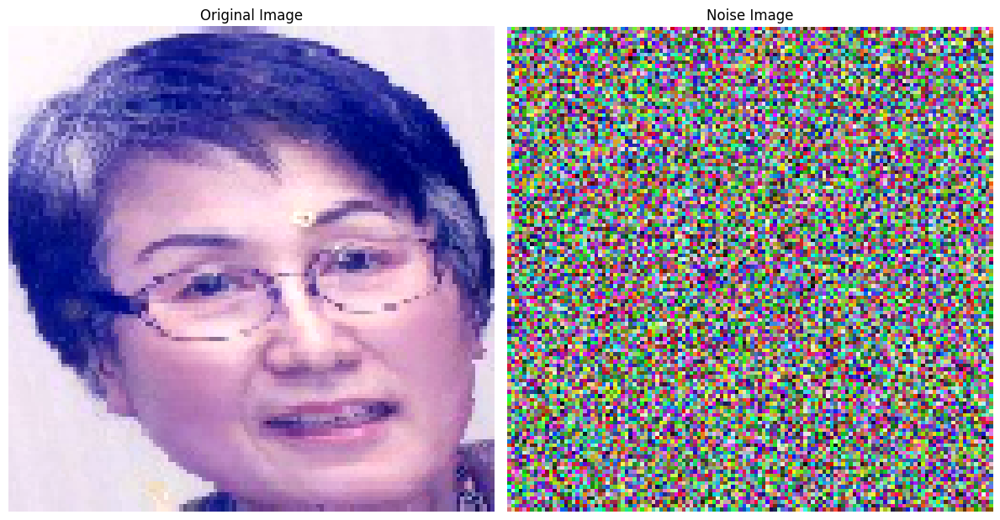

Epoch [1/2], Batch [1/134] - Batch Loss: 9.1054


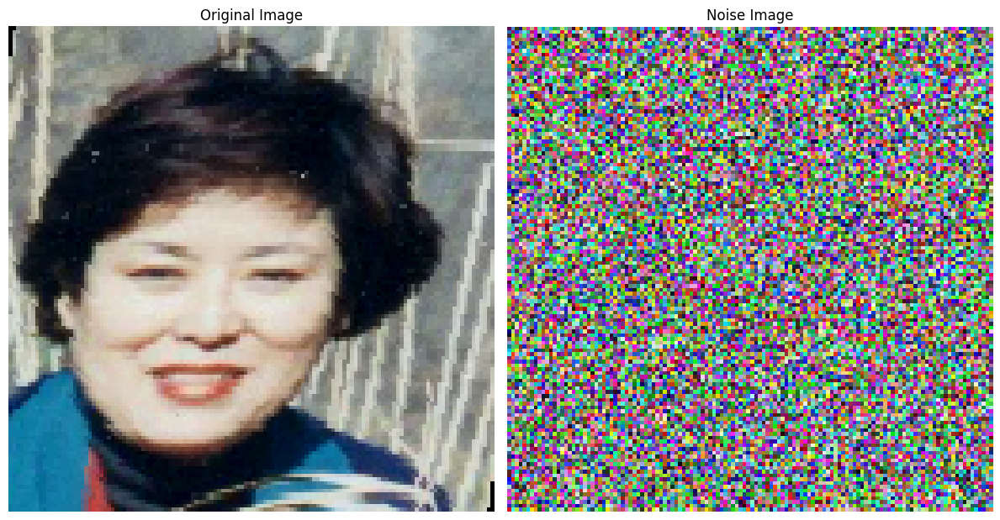

Epoch [1/2], Batch [2/134] - Batch Loss: 5.2935


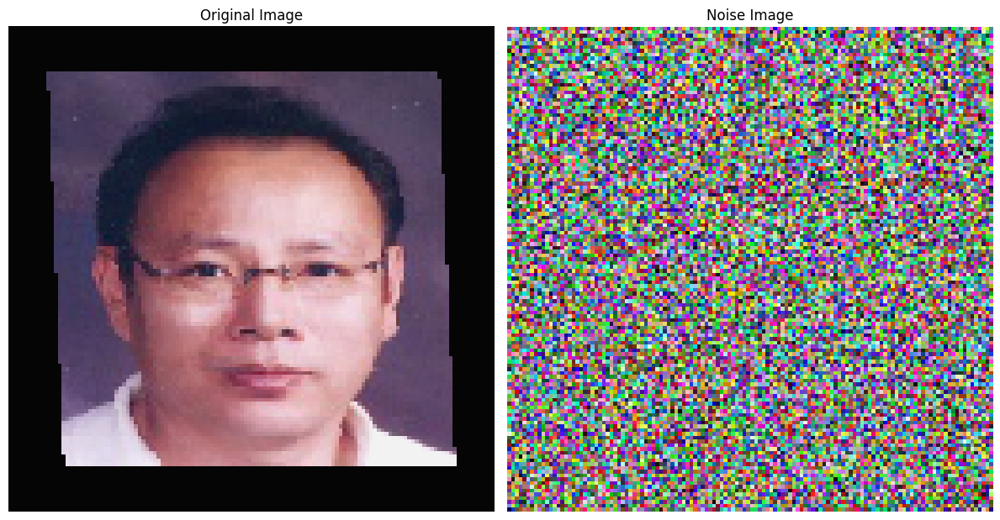

Epoch [1/2], Batch [3/134] - Batch Loss: 4.6351


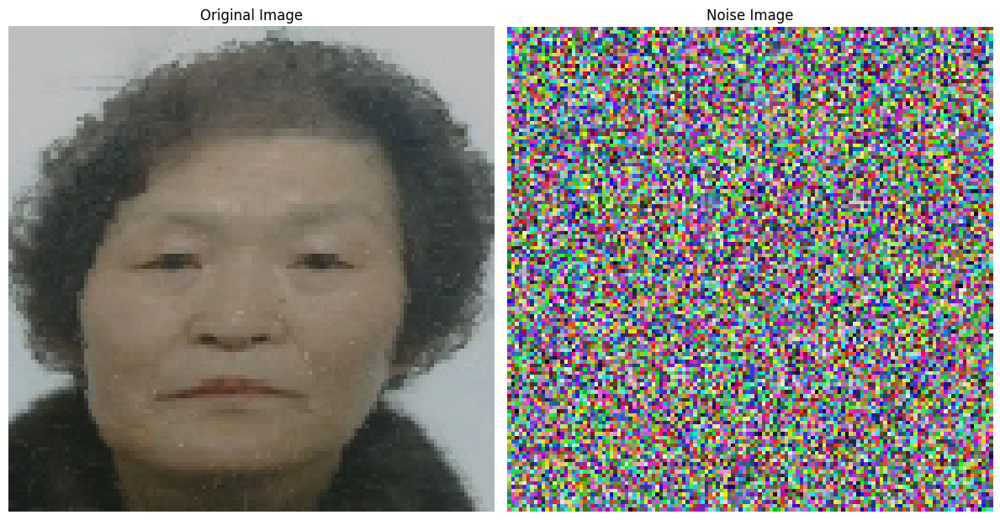

Epoch [1/2], Batch [4/134] - Batch Loss: 2.9884


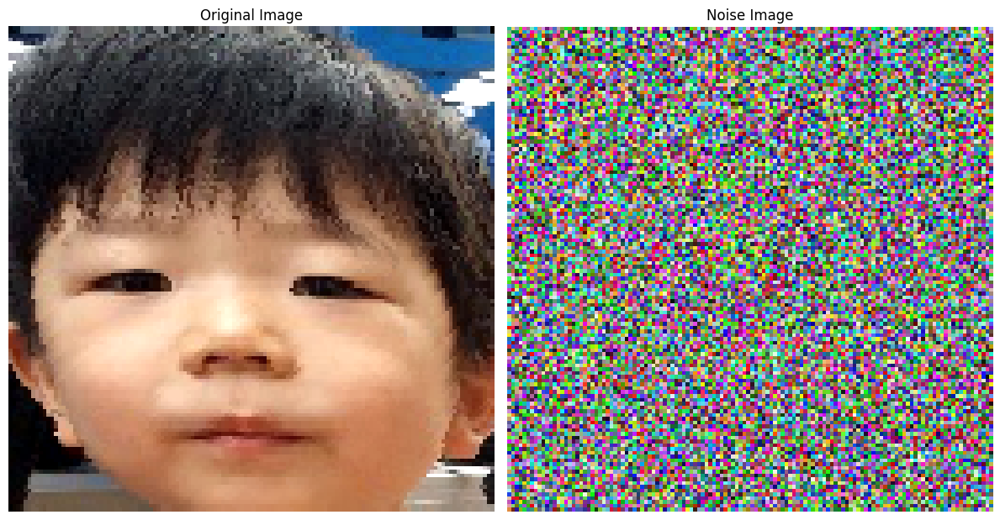

Epoch [1/2], Batch [5/134] - Batch Loss: 3.3229


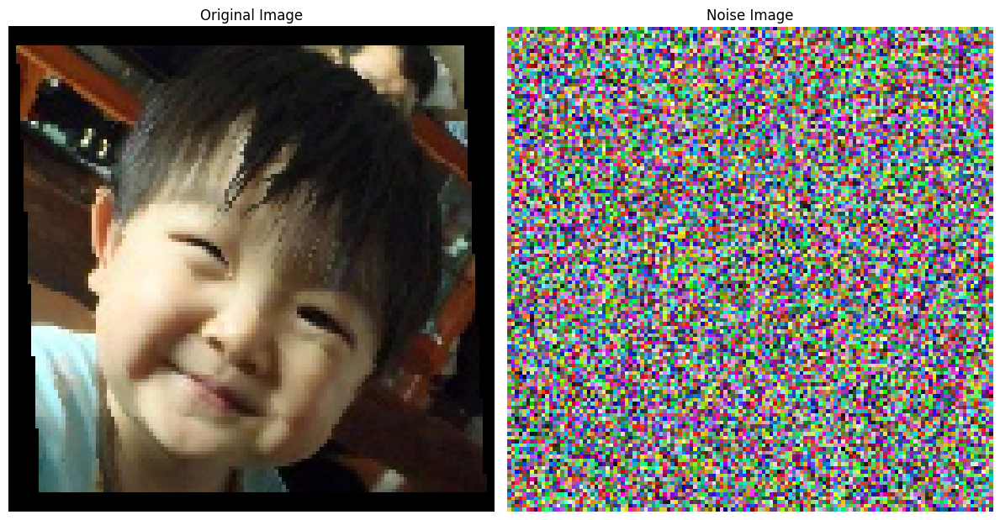

Epoch [1/2], Batch [6/134] - Batch Loss: 2.3229


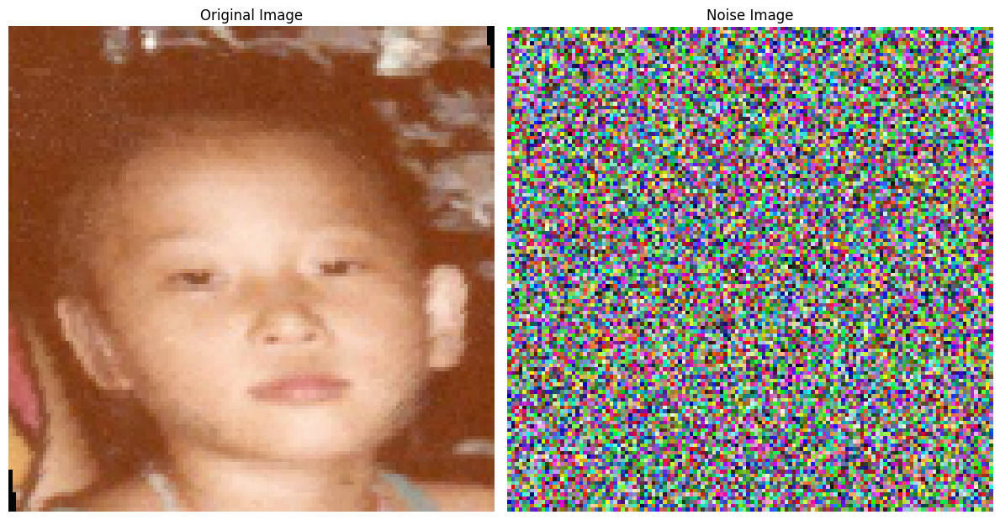

Epoch [1/2], Batch [7/134] - Batch Loss: 2.1794


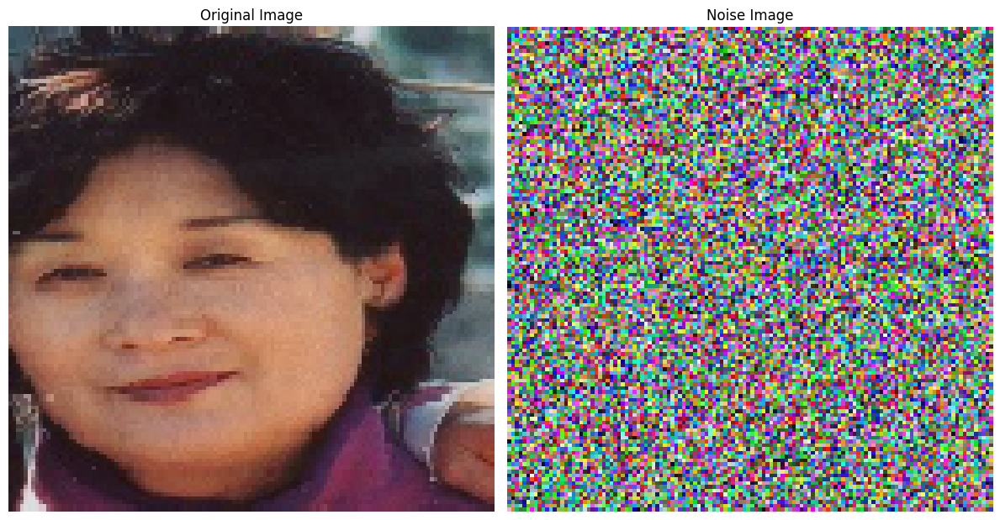

Epoch [1/2], Batch [8/134] - Batch Loss: 2.1052


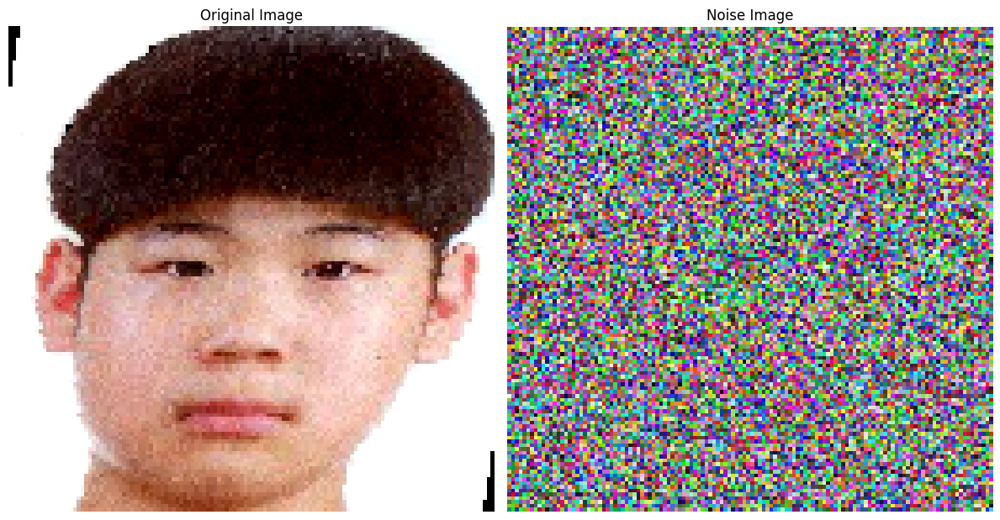

Epoch [1/2], Batch [9/134] - Batch Loss: 2.0183


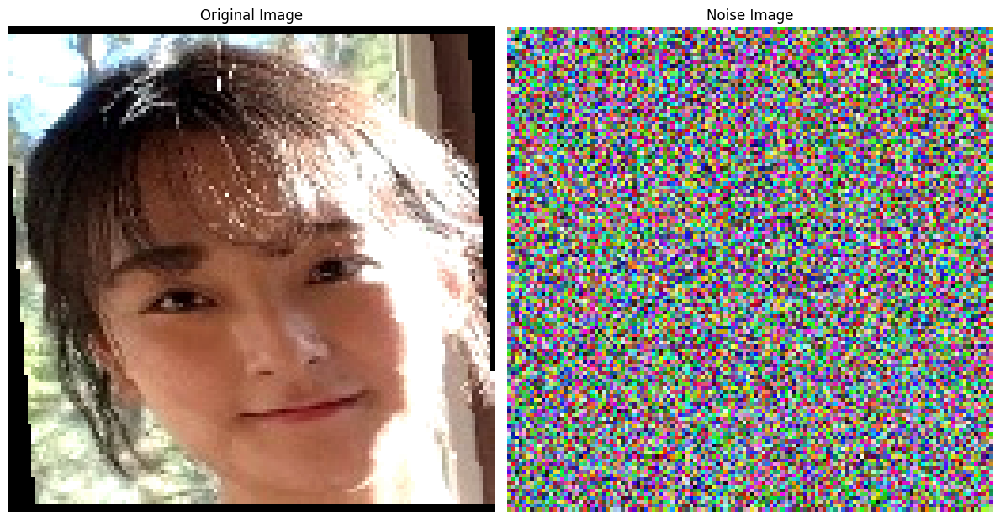

Epoch [1/2], Batch [10/134] - Batch Loss: 2.2210


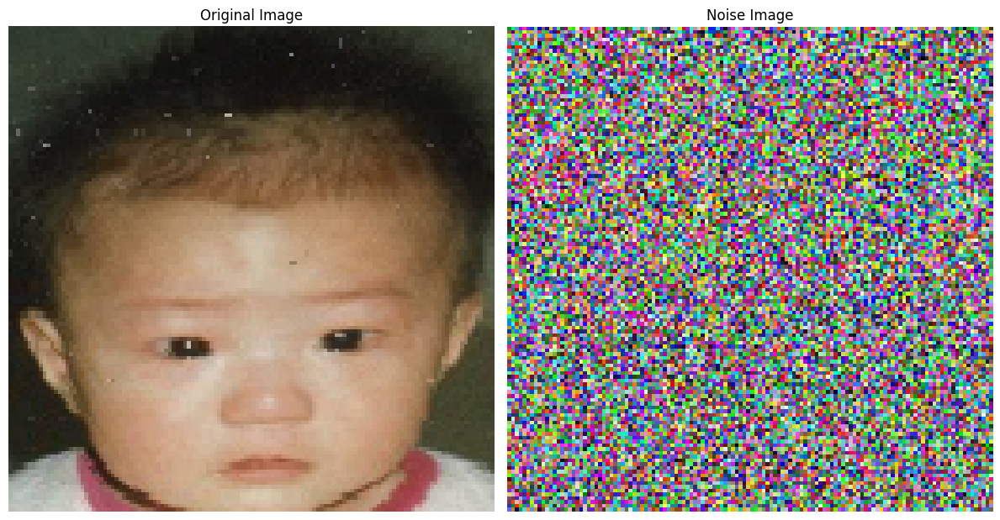

Epoch [1/2], Batch [11/134] - Batch Loss: 2.1352


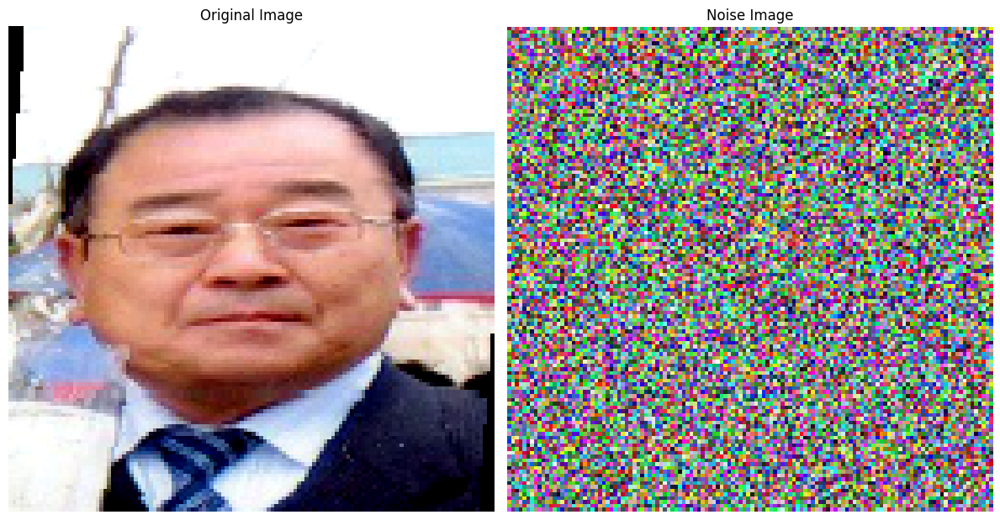

Epoch [1/2], Batch [12/134] - Batch Loss: 2.2429


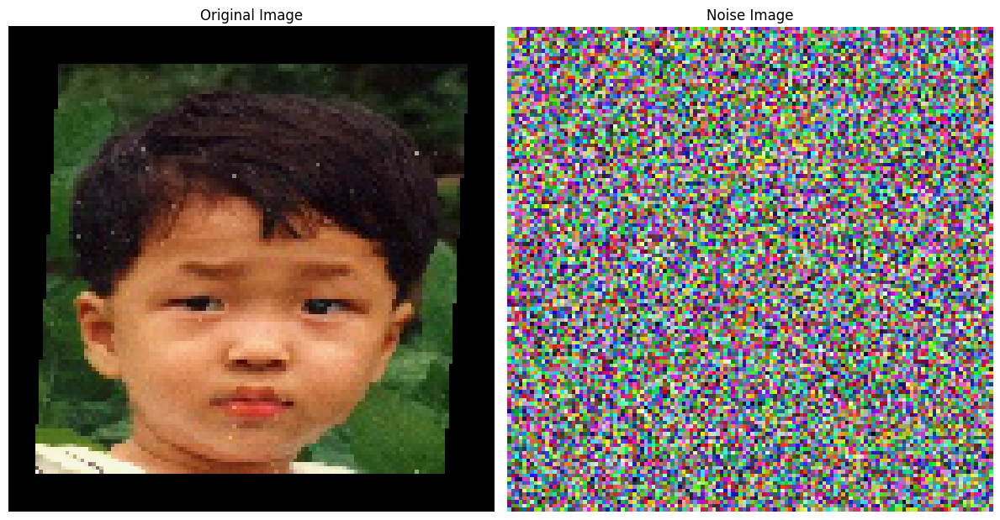

Epoch [1/2], Batch [13/134] - Batch Loss: 2.1468


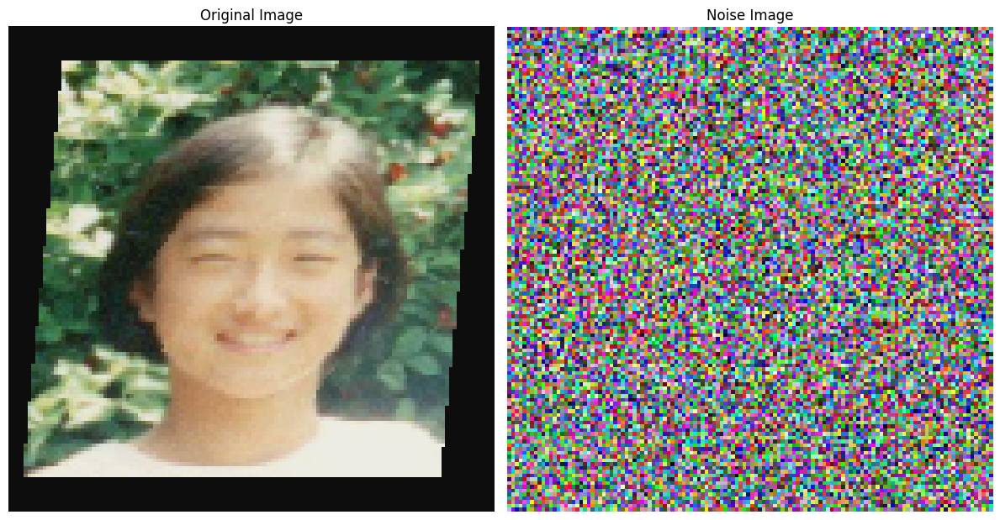

Epoch [1/2], Batch [14/134] - Batch Loss: 2.0595


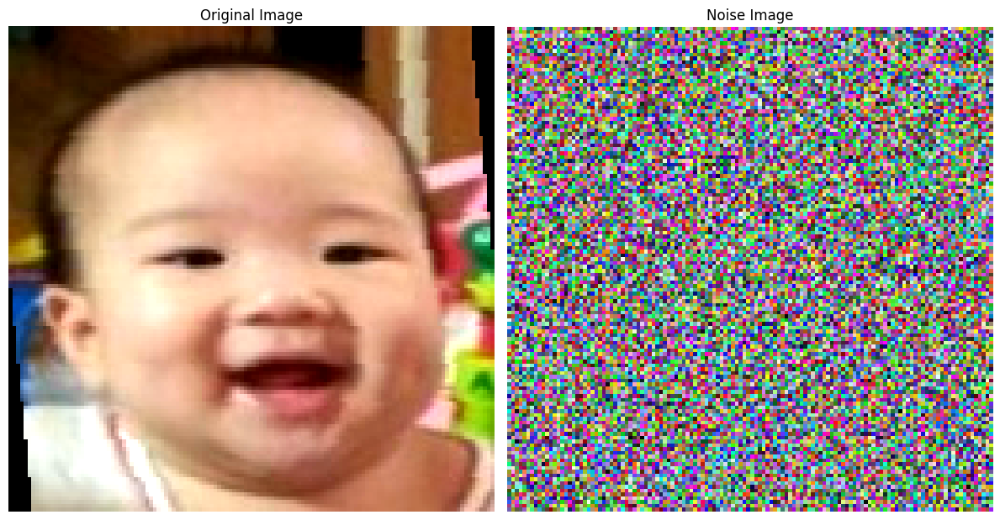

Epoch [1/2], Batch [15/134] - Batch Loss: 2.1603


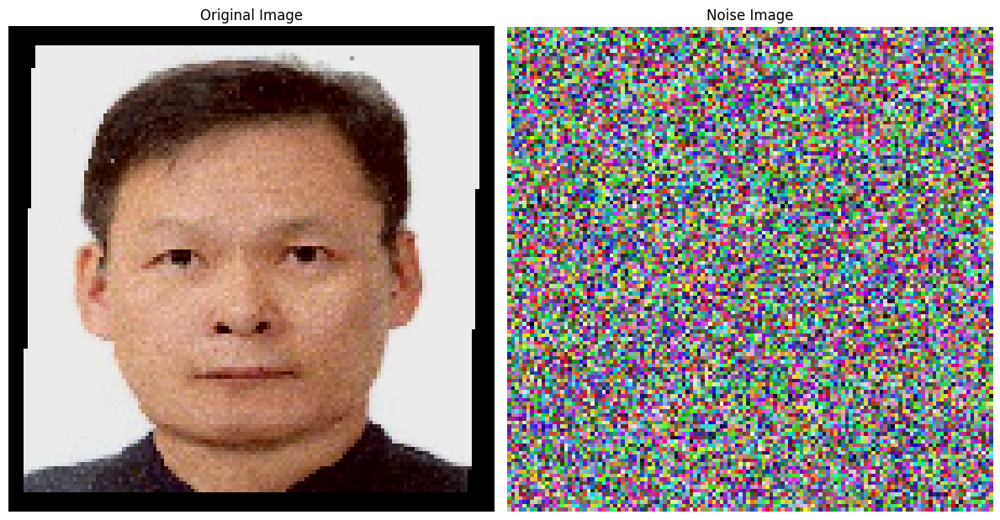

Epoch [1/2], Batch [16/134] - Batch Loss: 2.0187


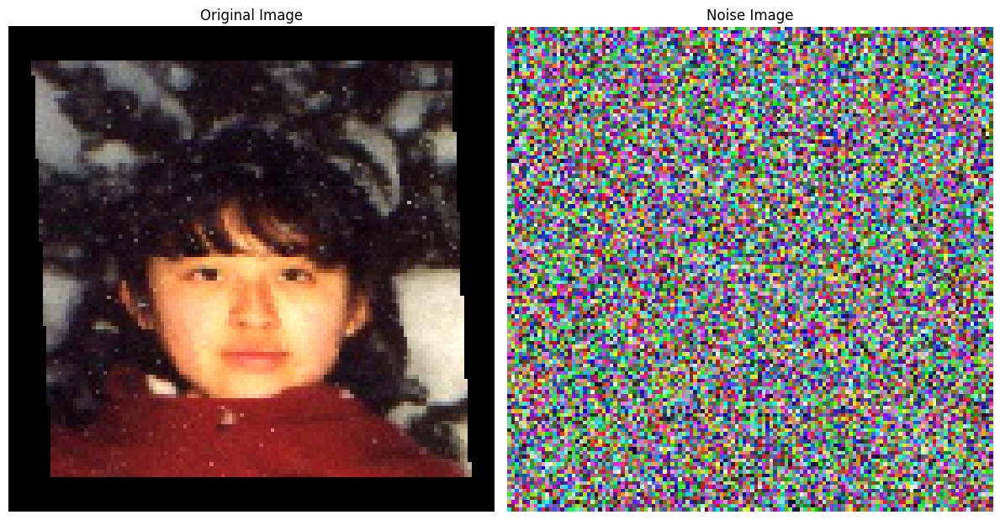

Epoch [1/2], Batch [17/134] - Batch Loss: 1.9936


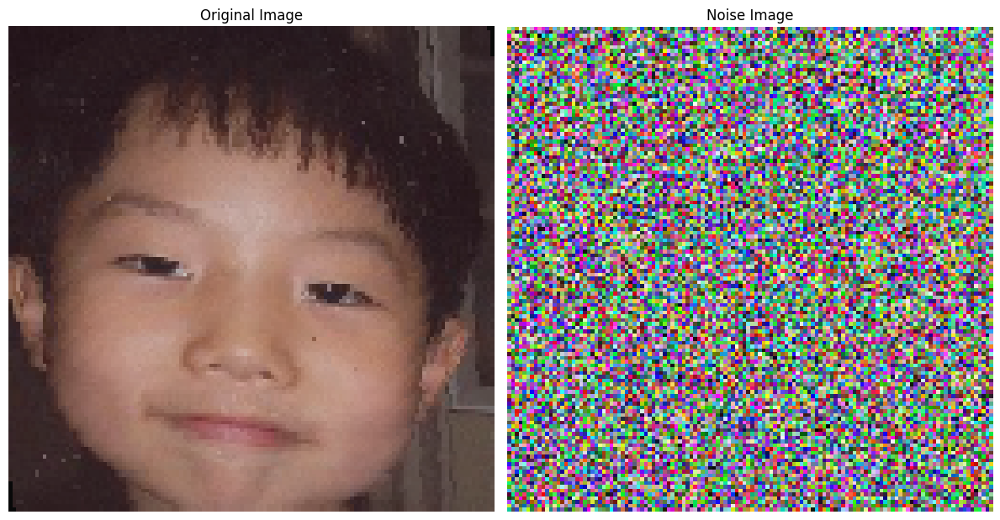

Epoch [1/2], Batch [18/134] - Batch Loss: 2.1423


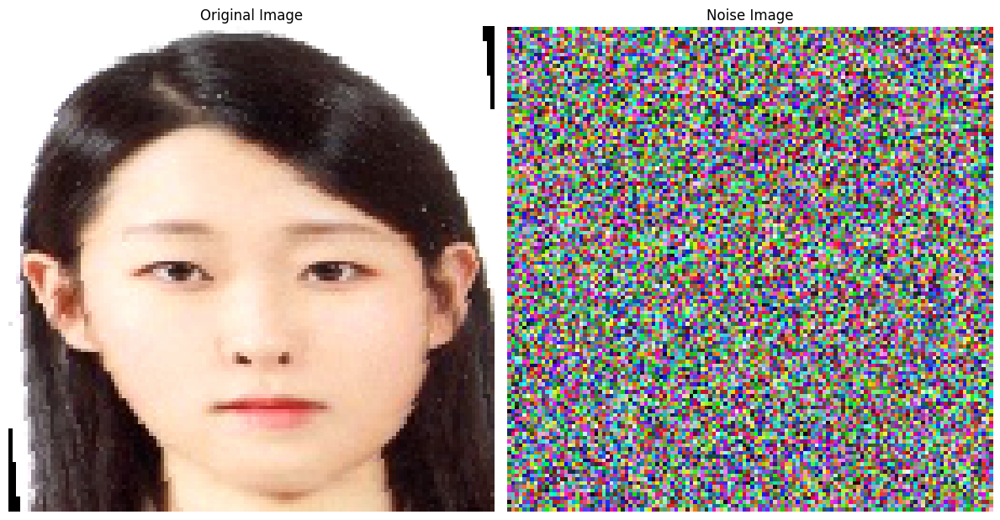

Epoch [1/2], Batch [19/134] - Batch Loss: 1.9854


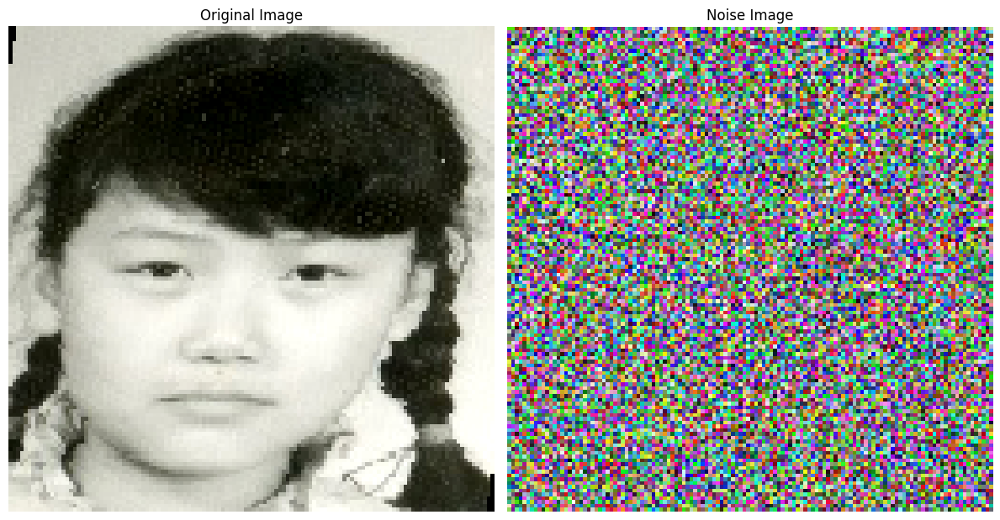

Epoch [1/2], Batch [20/134] - Batch Loss: 2.0672


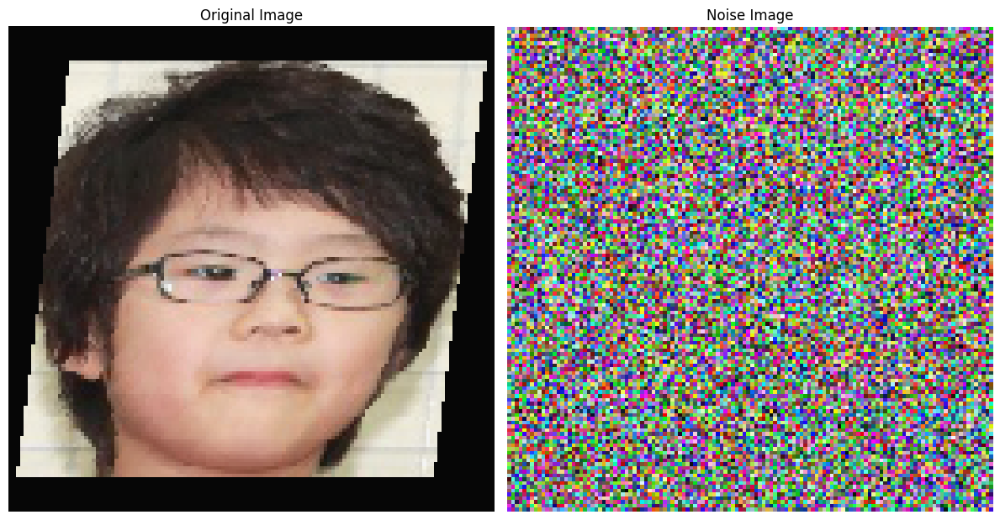

Epoch [1/2], Batch [21/134] - Batch Loss: 2.0648


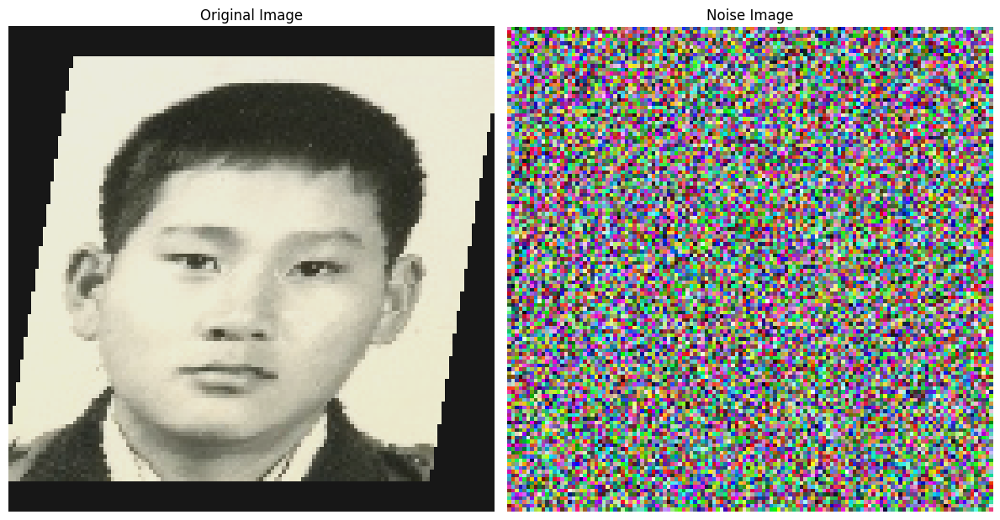

Epoch [1/2], Batch [22/134] - Batch Loss: 2.0071


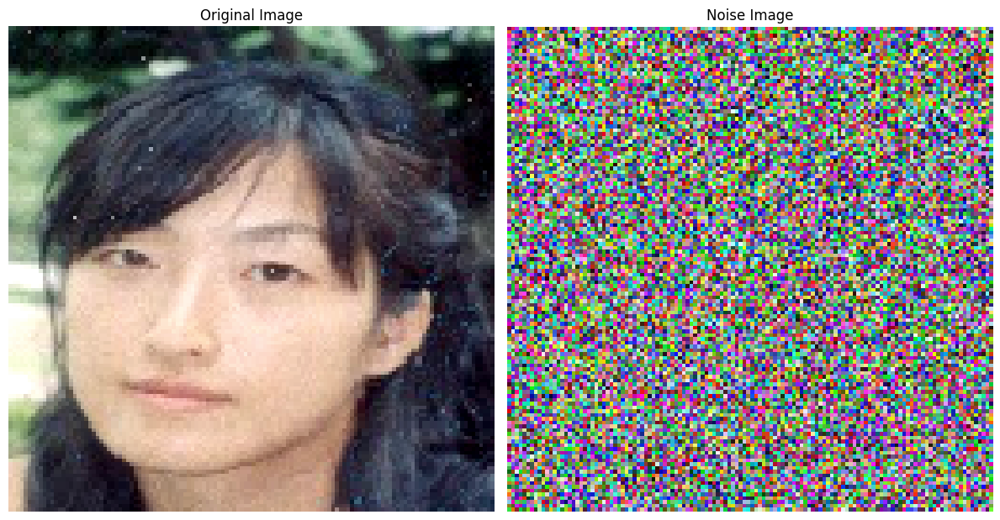

Epoch [1/2], Batch [23/134] - Batch Loss: 1.9452
Epoch [1/2] - Train Loss: 0.4714


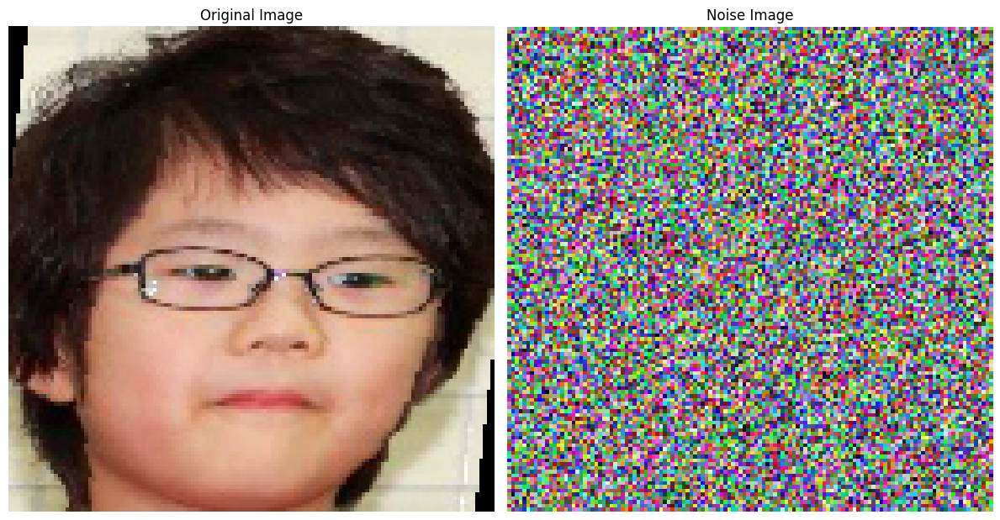

Epoch [2/2], Batch [1/134] - Batch Loss: 2.2432


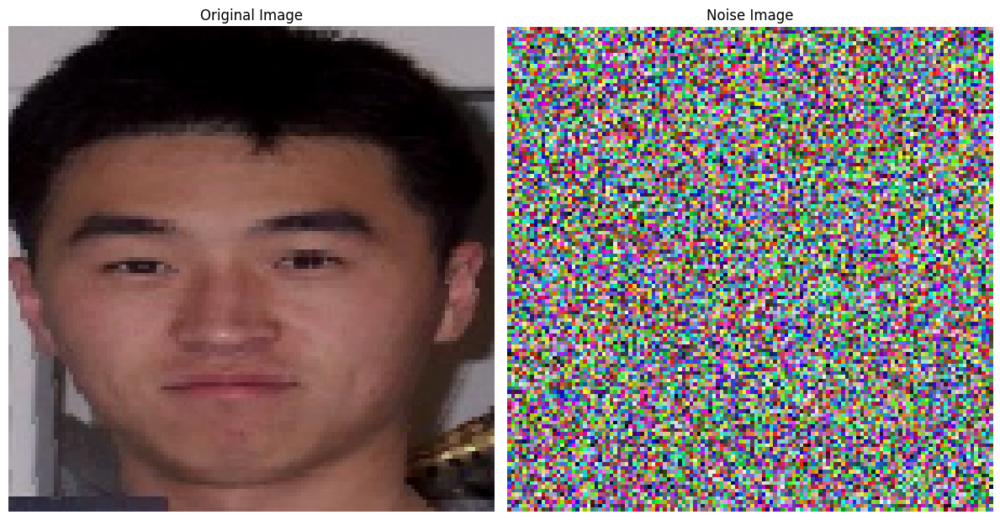

Epoch [2/2], Batch [2/134] - Batch Loss: 2.0624


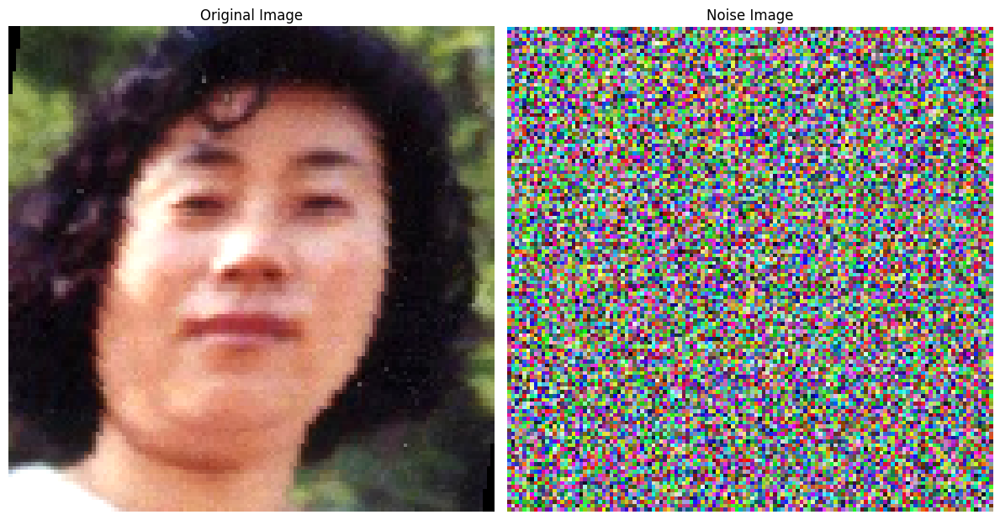

Epoch [2/2], Batch [3/134] - Batch Loss: 2.0760


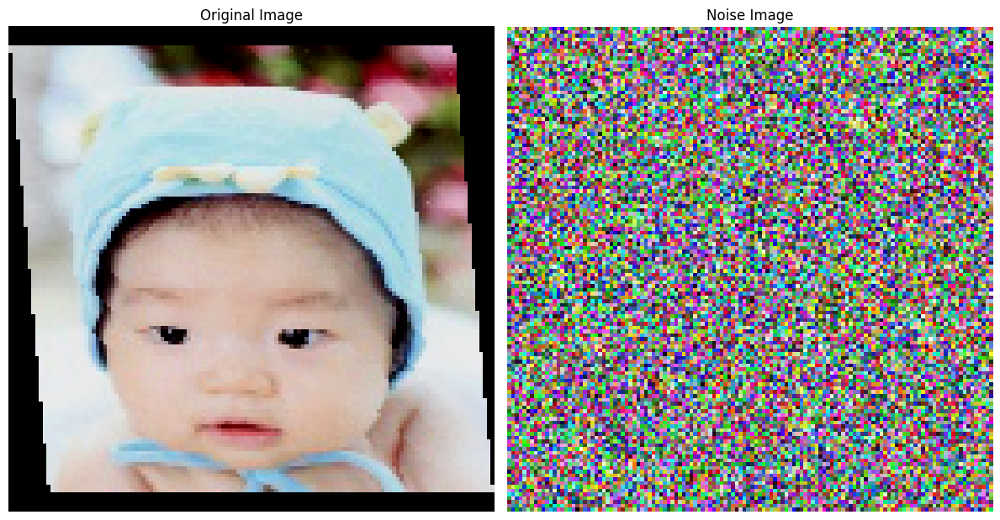

Epoch [2/2], Batch [4/134] - Batch Loss: 2.1302


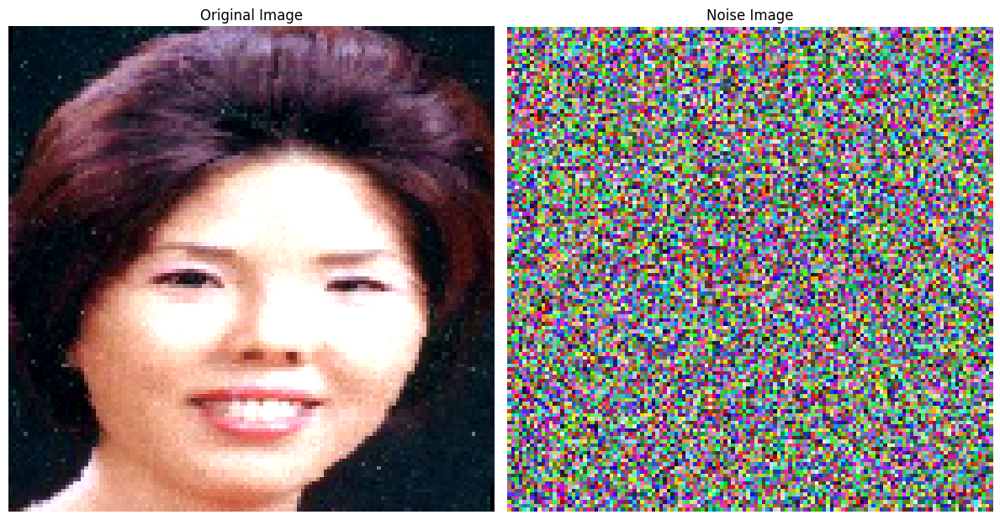

Epoch [2/2], Batch [5/134] - Batch Loss: 2.0191


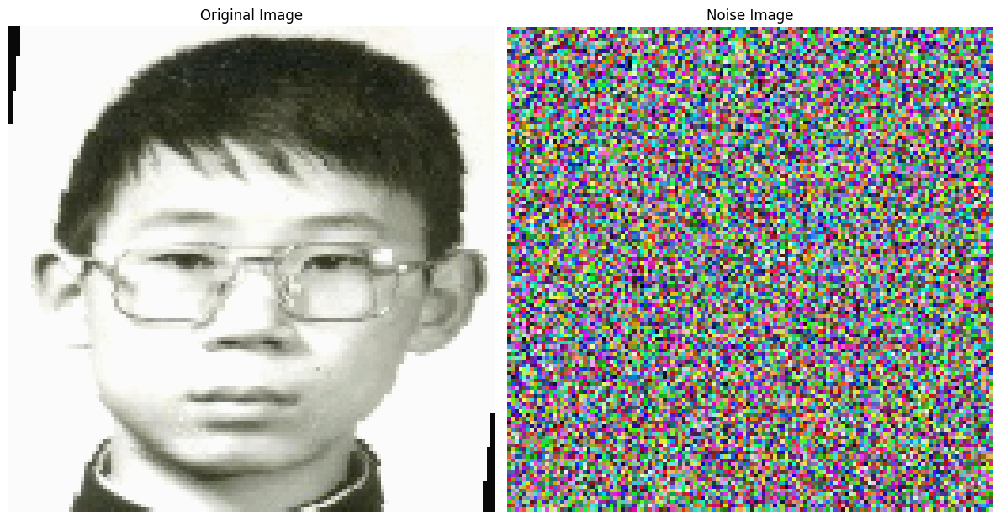

Epoch [2/2], Batch [6/134] - Batch Loss: 2.0489


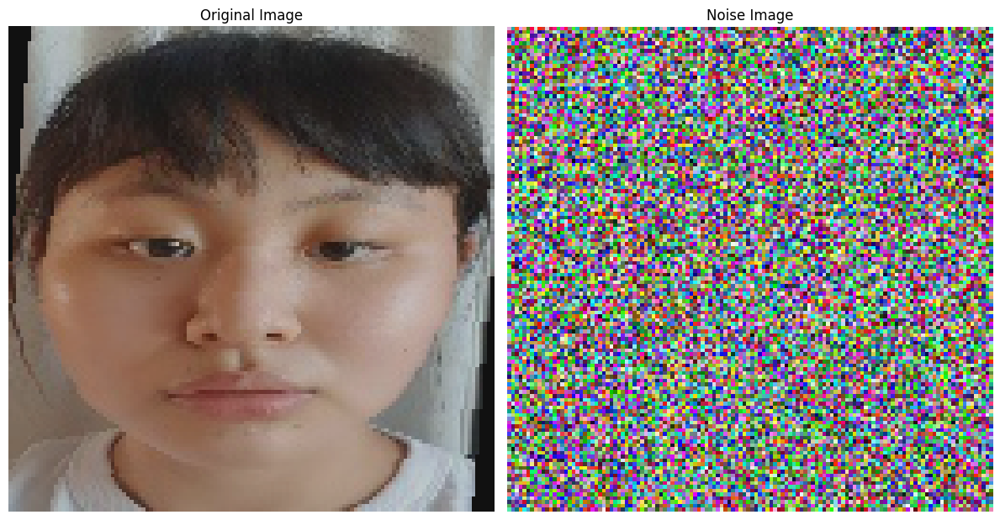

Epoch [2/2], Batch [7/134] - Batch Loss: 2.0712


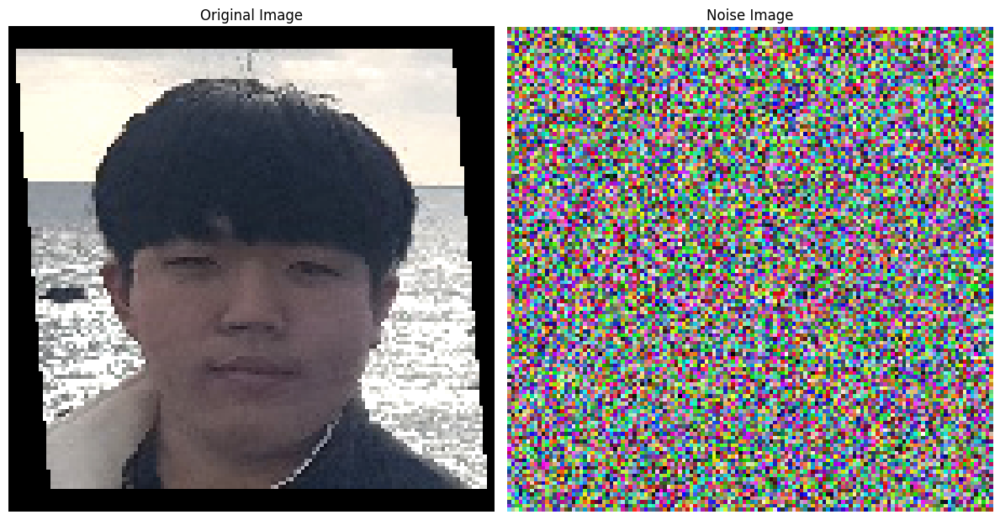

Epoch [2/2], Batch [8/134] - Batch Loss: 2.0348


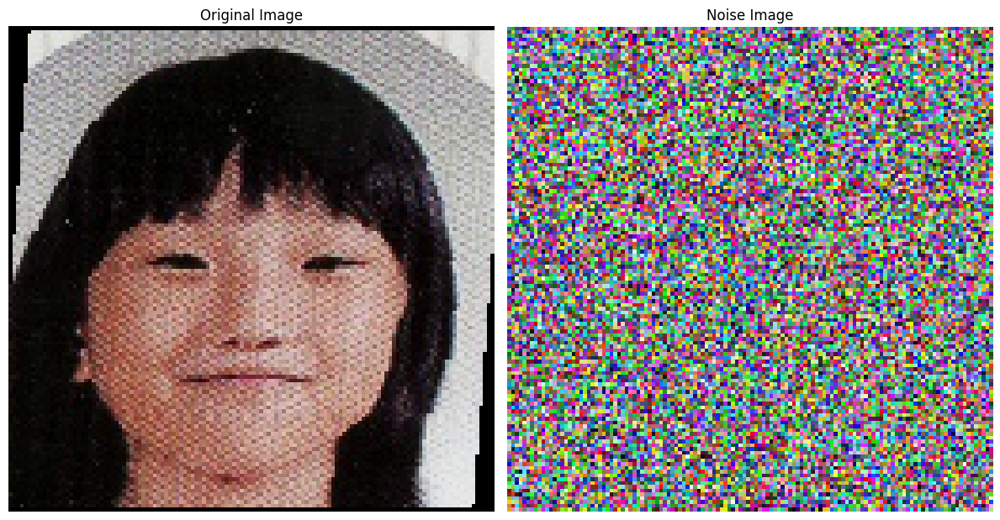

Epoch [2/2], Batch [9/134] - Batch Loss: 1.8993


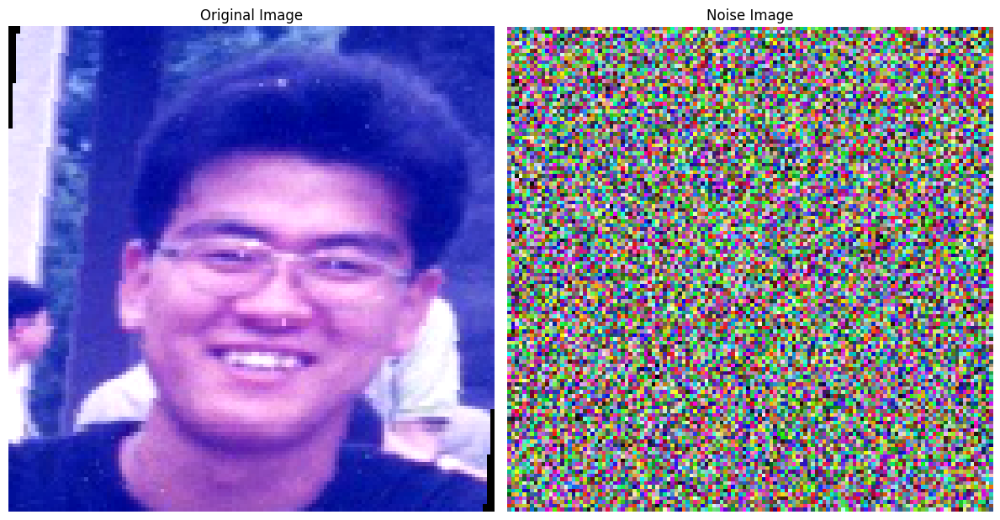

Epoch [2/2], Batch [10/134] - Batch Loss: 1.9156


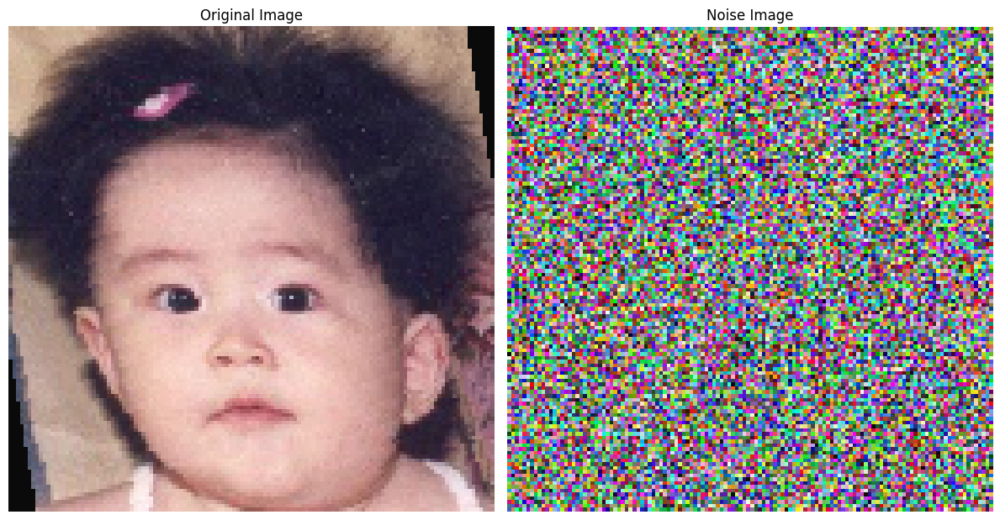

Epoch [2/2], Batch [11/134] - Batch Loss: 2.1398


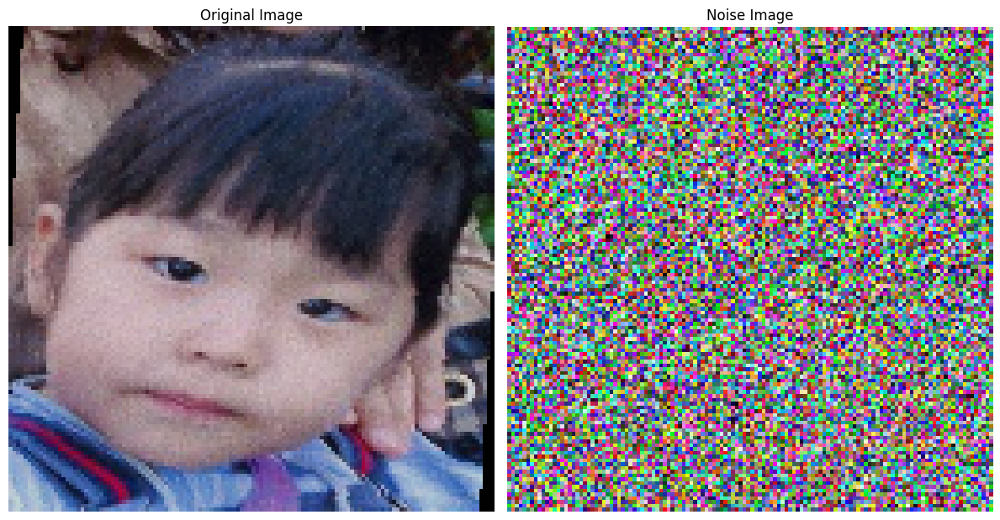

Epoch [2/2], Batch [12/134] - Batch Loss: 1.9097


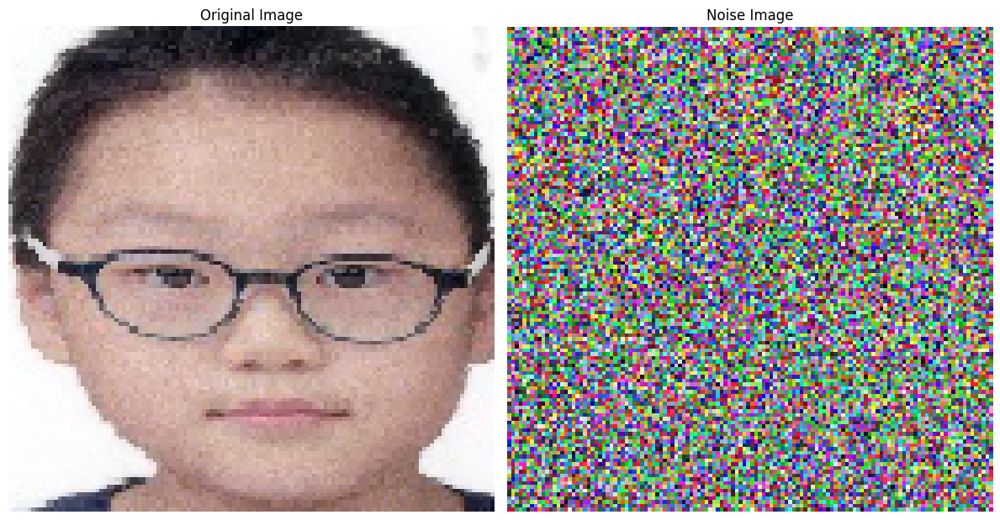

Epoch [2/2], Batch [13/134] - Batch Loss: 2.0706


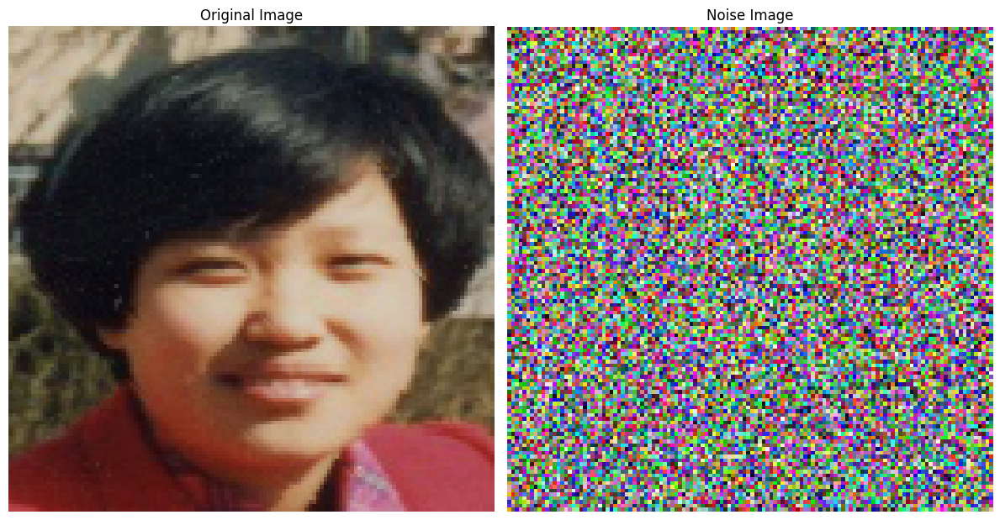

Epoch [2/2], Batch [14/134] - Batch Loss: 1.9537


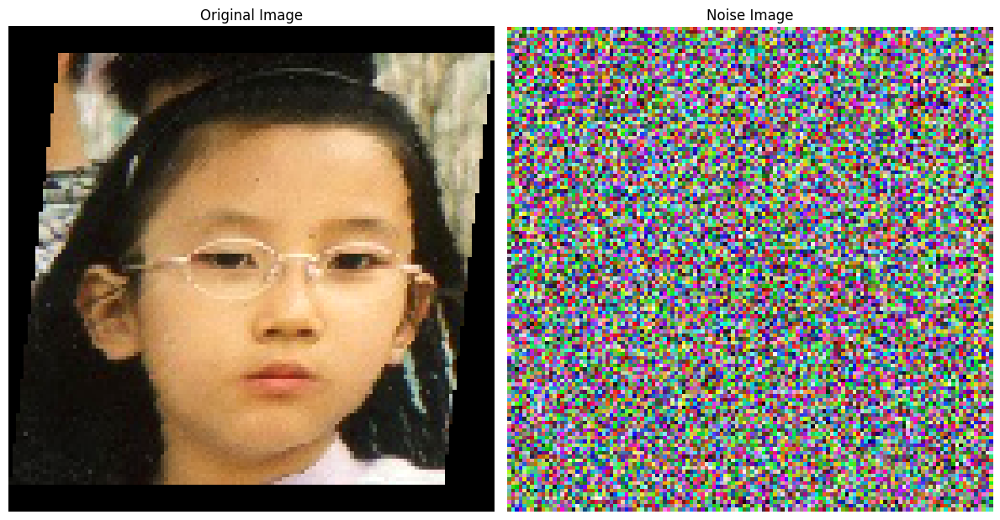

Epoch [2/2], Batch [15/134] - Batch Loss: 1.9678


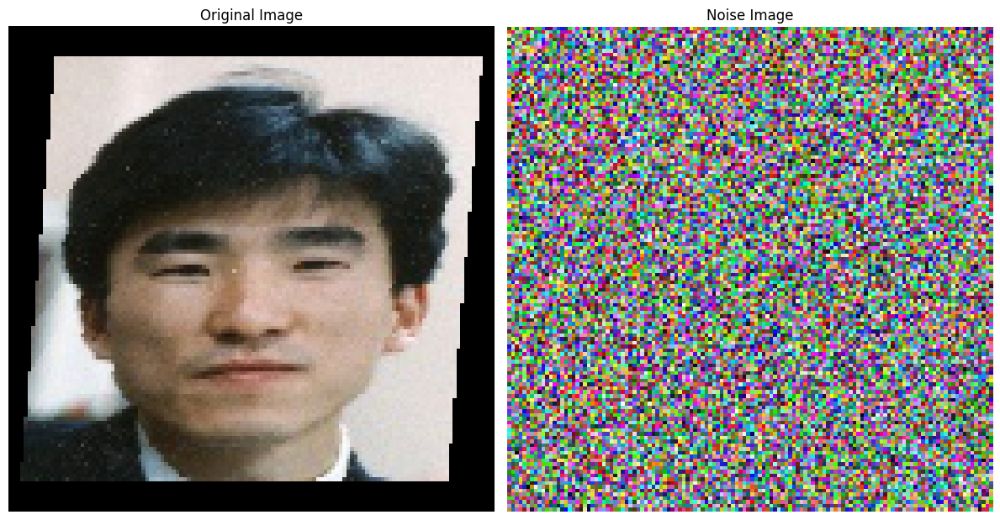

Epoch [2/2], Batch [16/134] - Batch Loss: 1.9762


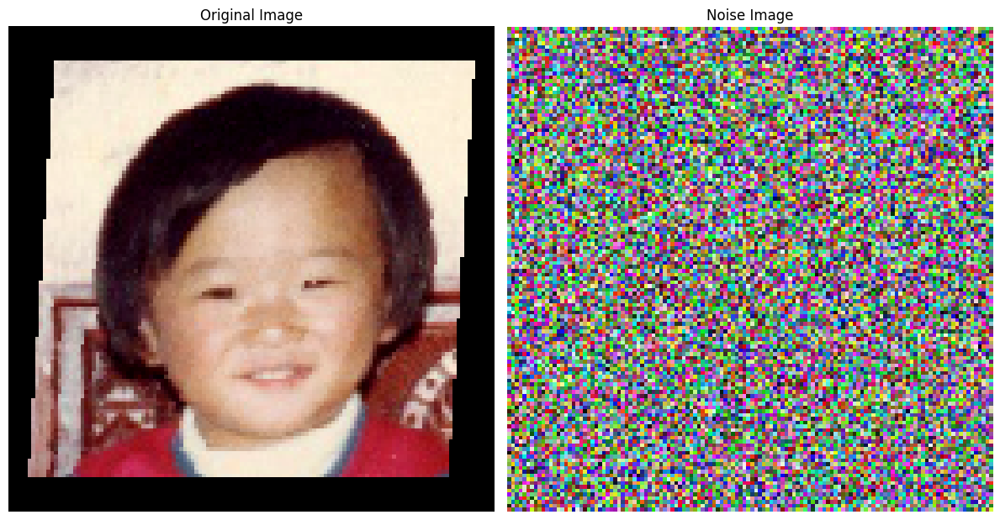

Epoch [2/2], Batch [17/134] - Batch Loss: 1.8228


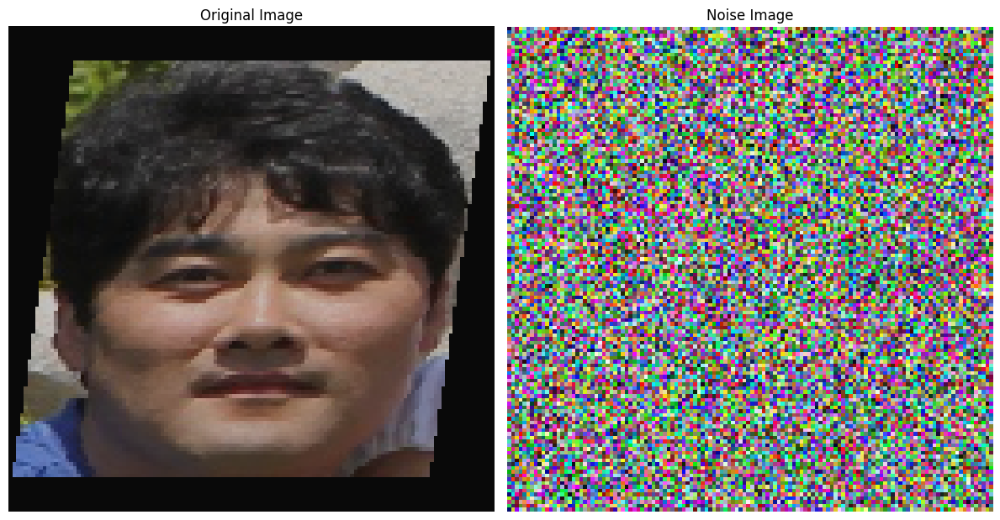

Epoch [2/2], Batch [18/134] - Batch Loss: 2.1479


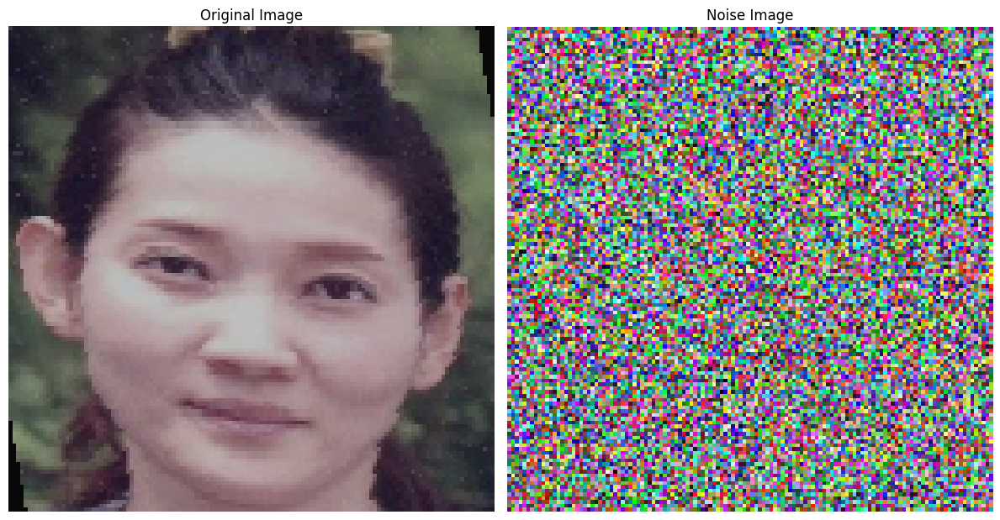

Epoch [2/2], Batch [19/134] - Batch Loss: 1.9772


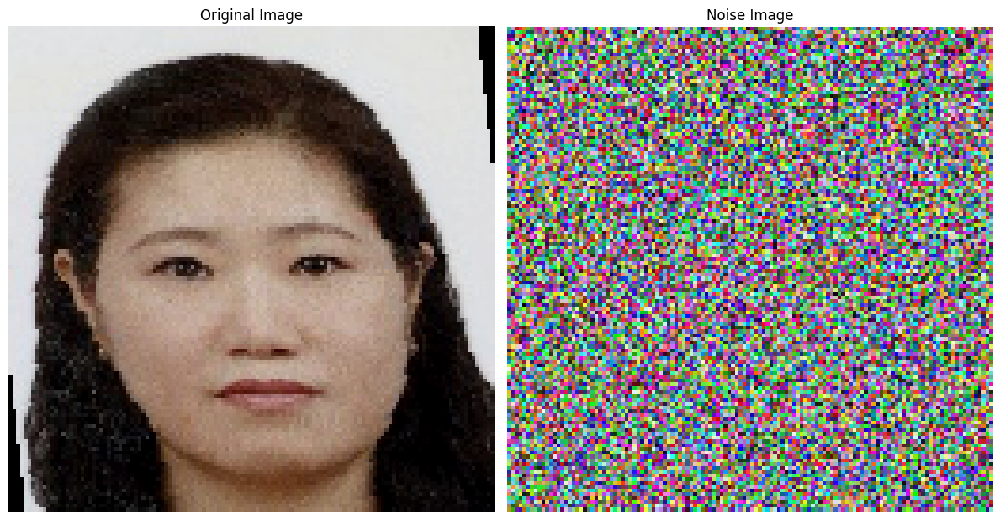

Epoch [2/2], Batch [20/134] - Batch Loss: 1.9855


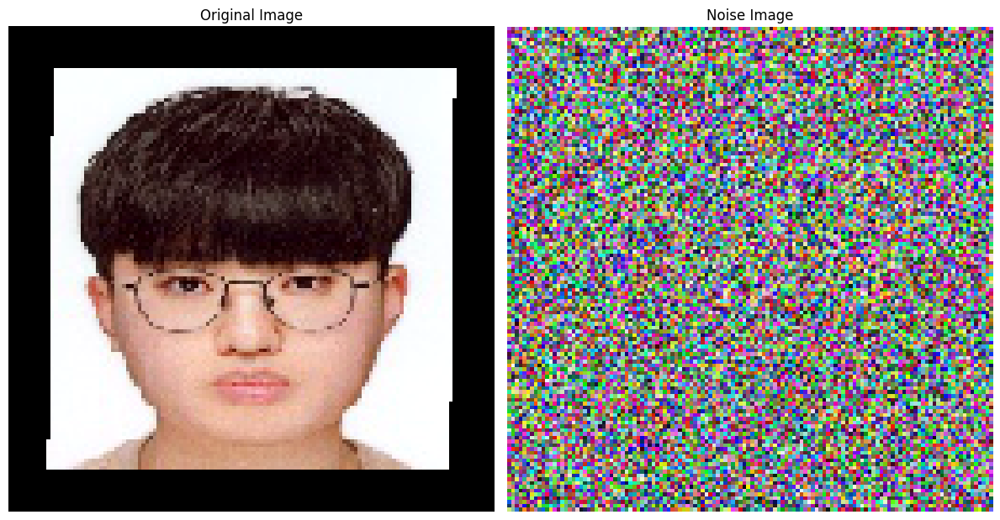

Epoch [2/2], Batch [21/134] - Batch Loss: 1.9589


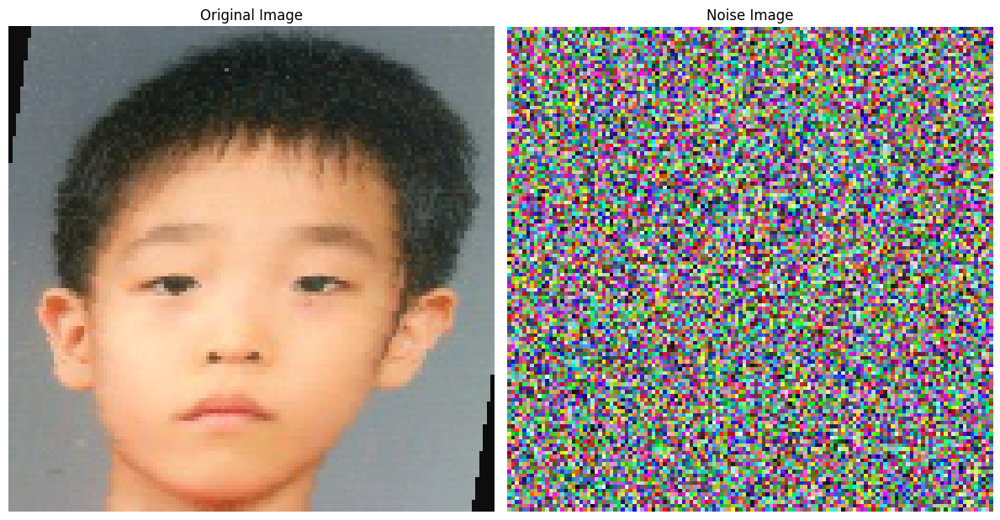

Epoch [2/2], Batch [22/134] - Batch Loss: 1.9377


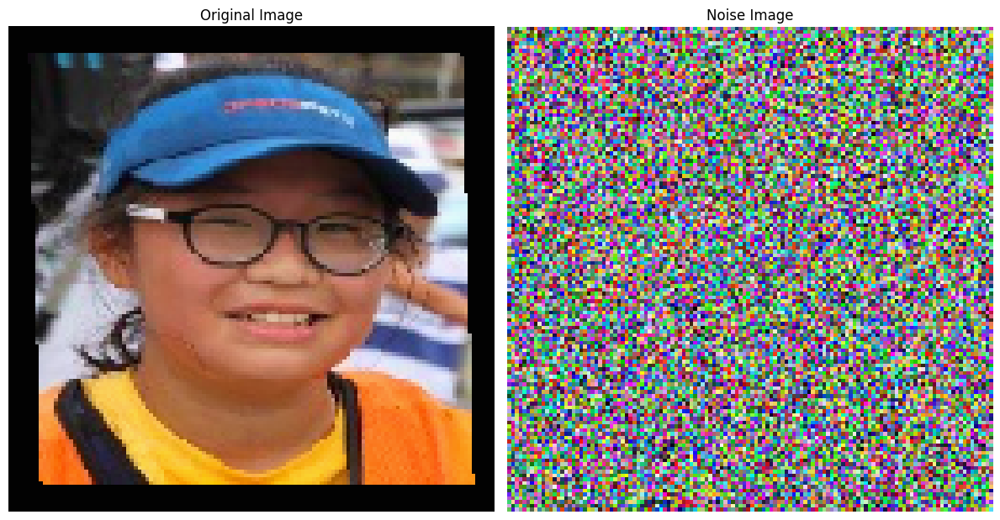

Epoch [2/2], Batch [23/134] - Batch Loss: 2.0820
Epoch [2/2] - Train Loss: 0.3465


In [62]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

print_interval = 1
train_epoch_losses = []

num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, ((x_retain, y_retain), (x_forget, y_forget)) in enumerate(zip(retain_dataloader_train, forget_dataloader_train)):
        y_retain = y_retain.cuda()
        batch_size_forget = y_forget.size(0)

        if x_retain.size(0) != 64 or x_forget.size(0) != 64:
            continue

        # Initialize the noise.
        noise_dim = x_retain.size(1), x_retain.size(2), x_retain.size(3)
        noise = Noise(batch_size_forget, *noise_dim).cuda()
        noise_optimizer = torch.optim.Adam(noise.parameters(), lr=0.01)
        noise_tensor = noise()[:batch_size_forget]

        # Update the noise for increasing the loss value.
        for _ in range(5):
            outputs = unlearned_model(noise_tensor)
            with torch.no_grad():
                target_logits = unlearned_model(x_forget.cuda())
            # Maximize the similarity between noise data and forget features.
            loss_noise = -F.mse_loss(outputs, target_logits)

            # Backpropagate to update the noise.
            noise_optimizer.zero_grad()
            loss_noise.backward(retain_graph=True)
            noise_optimizer.step()

        # Train the model with noise and retain image
        noise_tensor = torch.clamp(noise_tensor, 0, 1).detach().cuda()
        outputs = unlearned_model(noise_tensor.cuda())
        loss_1 = criterion(outputs, y_retain)

        outputs = unlearned_model(x_retain.cuda())
        loss_2 = criterion(outputs, y_retain)

        joint_loss = loss_1 + loss_2

        optimizer.zero_grad()
        joint_loss.backward()
        optimizer.step()
        running_loss += joint_loss.item() * x_retain.size(0)

        original_image = x_retain[0].cpu().numpy().transpose(1, 2, 0)
        image1 = TF.to_pil_image(float_to_uint8(original_image))
        image2 = TF.to_pil_image(noise.noise[0].cpu())

        # Display original image.
        original_image = x_retain[0].cpu().numpy().transpose(1, 2, 0)
        plt.figure(figsize=(12, 8))
        plt.subplot(1, 2, 1)  # 2 rows, 2 columns, position 1
        plt.imshow(image1)
        plt.title("Original Image")
        plt.axis('off')

        # Display first noise image.
        plt.subplot(1, 2, 2)
        plt.imshow(image2)
        plt.title("Noise Image")
        plt.axis('off')

        # Show all the subplots.
        plt.tight_layout()
        plt.show()

        if batch_idx % print_interval == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {joint_loss.item():.4f}")

    average_train_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    train_epoch_losses.append(average_train_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {average_train_loss:.4f}")

In [63]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.02132989466190338, running test accuracy: 0.59375, running top-2 accuracy: 0.921875
test loss: 0.024613822102933988, accuracy: 0.5795971410006497, top-2 accuracy: 0.8739441195581547
elapsed time: 2.8285484313964844
[Test]
[Batch: 1] running test loss: 0.01830987073481083, running test accuracy: 0.640625, running top-2 accuracy: 0.96875
test loss: 0.020334936757671073, accuracy: 0.6376329787234043, top-2 accuracy: 0.8849734042553191
elapsed time: 2.621870756149292
Test Acc: {'Loss': 0.024613822102933988, 'Acc': 0.5795971410006497, 'Top-2 Acc': 0.8739441195581547}
Unseen Acc: {'Loss': 0.020334936757671073, 'Acc': 0.6376329787234043, 'Top-2 Acc': 0.8849734042553191}
MIA: {'MIA': 0.7122923588039867, 'Forgeting Score': 0.21229235880398667}
Final Score: 0.5775062116963382
KL-Div w.r.t Retrained model: 1.624935022354126


<b>Stage 2: Repair</b>

In [64]:
set_seed(42)

criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(unlearned_model.parameters(), lr=0.001)

num_epochs = 1
for epoch in range(num_epochs):
    running_loss = 0

    for batch_idx, (x_retain, y_retain) in enumerate(retain_dataloader_train):
        y_retain = y_retain.cuda()

        # Classification Loss
        outputs_retain = unlearned_model(x_retain.cuda())
        classification_loss = criterion(outputs_retain, y_retain)

        optimizer.zero_grad()
        classification_loss.backward()
        optimizer.step()

        running_loss += classification_loss.item() * x_retain.size(0)
        print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(retain_dataloader_train)}] - Batch Loss: {classification_loss.item():.4f}")

    average_epoch_loss = running_loss / (len(retain_dataloader_train) * x_retain.size(0))
    print(f"Epoch [{epoch+1}/{num_epochs}] - Total Loss: {running_loss:.4f}")

Epoch [1/1], Batch [1/134] - Batch Loss: 0.0890
Epoch [1/1], Batch [2/134] - Batch Loss: 0.0730
Epoch [1/1], Batch [3/134] - Batch Loss: 0.1916
Epoch [1/1], Batch [4/134] - Batch Loss: 0.1167
Epoch [1/1], Batch [5/134] - Batch Loss: 0.1722
Epoch [1/1], Batch [6/134] - Batch Loss: 0.0857
Epoch [1/1], Batch [7/134] - Batch Loss: 0.1849
Epoch [1/1], Batch [8/134] - Batch Loss: 0.1533
Epoch [1/1], Batch [9/134] - Batch Loss: 0.1806
Epoch [1/1], Batch [10/134] - Batch Loss: 0.0710
Epoch [1/1], Batch [11/134] - Batch Loss: 0.1732
Epoch [1/1], Batch [12/134] - Batch Loss: 0.2211
Epoch [1/1], Batch [13/134] - Batch Loss: 0.0499
Epoch [1/1], Batch [14/134] - Batch Loss: 0.1902
Epoch [1/1], Batch [15/134] - Batch Loss: 0.0968
Epoch [1/1], Batch [16/134] - Batch Loss: 0.1591
Epoch [1/1], Batch [17/134] - Batch Loss: 0.1275
Epoch [1/1], Batch [18/134] - Batch Loss: 0.0707
Epoch [1/1], Batch [19/134] - Batch Loss: 0.1257
Epoch [1/1], Batch [20/134] - Batch Loss: 0.0889
Epoch [1/1], Batch [21/134] -

In [65]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.02283739671111107, running test accuracy: 0.640625, running top-2 accuracy: 0.90625
test loss: 0.02662851444074595, accuracy: 0.5854450942170241, top-2 accuracy: 0.8622482131254061
elapsed time: 2.676837921142578
[Test]
[Batch: 1] running test loss: 0.017304468899965286, running test accuracy: 0.703125, running top-2 accuracy: 0.96875
test loss: 0.021864856573495458, accuracy: 0.6382978723404256, top-2 accuracy: 0.8696808510638298
elapsed time: 2.580703020095825
Test Acc: {'Loss': 0.02662851444074595, 'Acc': 0.5854450942170241, 'Top-2 Acc': 0.8622482131254061}
Unseen Acc: {'Loss': 0.021864856573495458, 'Acc': 0.6382978723404256, 'Top-2 Acc': 0.8696808510638298}
MIA: {'MIA': 0.7053156146179402, 'Forgeting Score': 0.20531561461794023}
Final Score: 0.5874069324905717
KL-Div w.r.t Retrained model: 1.6584466740290325


#### <b>Scrub</b>

In [100]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
original_model = models.resnet18(pretrained=False)
num_features = original_model.fc.in_features
original_model.fc = nn.Linear(num_features, 8)
original_model.load_state_dict(torch.load(original_save_path))
original_model = original_model.cuda()
criterion = nn.CrossEntropyLoss()

In [101]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
scrub_model = models.resnet18(pretrained=False)
num_features = scrub_model.fc.in_features
scrub_model.fc = nn.Linear(num_features, 8)
scrub_model.load_state_dict(torch.load(original_save_path))
scrub_model = scrub_model.cuda()
criterion = nn.CrossEntropyLoss()

In [102]:
class DistillKL(nn.Module):
    def __init__(self, T):
        super(DistillKL, self).__init__()
        self.T = T

    def forward(self, y_s, y_t):
        p_s = F.log_softmax(y_s/self.T, dim=1)
        p_t = F.softmax(y_t/self.T, dim=1)
        loss = F.kl_div(p_s, p_t, size_average=False) * (self.T**2) / y_s.shape[0]
        return loss

In [103]:
class SCRUBTraining:
    def __init__(self, teacher, student, retain_dataloader, forget_dataloader):
        self.teacher = teacher
        self.student = student
        self.retain_dataloader = retain_dataloader
        self.forget_dataloader = forget_dataloader

        self.criterion_cls = nn.CrossEntropyLoss()
        self.criterion_div = DistillKL(4.0)
        self.criterion_kd = DistillKL(4.0)

        self.optimizer = optim.SGD(student.parameters(), lr=0.001)

    def train_epoch(self, maxstep=True):
        self.student.train()
        self.teacher.eval()

        # Function to compute accuracy.
        def compute_accuracy(outputs, labels):
            _, predicted = outputs.max(1)
            total = labels.size(0)
            correct = predicted.eq(labels).sum().item()
            return 100 * correct / total

        total_loss_retain, total_accuracy_retain = 0, 0
        total_loss_forget, total_accuracy_forget = 0, 0

        # Training with retain data.
        for inputs_retain, labels_retain in self.retain_dataloader:
            inputs_retain, labels_retain = inputs_retain.cuda(), labels_retain.cuda()

            # Forward pass: Student
            outputs_retain_student = self.student(inputs_retain)

            # Forward pass: Teacher
            with torch.no_grad():
                outputs_retain_teacher = self.teacher(inputs_retain)

            # Loss computation
            loss_cls = self.criterion_cls(outputs_retain_student, labels_retain)
            loss_div_retain = self.criterion_div(outputs_retain_student, outputs_retain_teacher)

            loss = loss_cls + loss_div_retain

            # Update total loss and accuracy for retain data.
            total_loss_retain += loss.item()
            total_accuracy_retain += compute_accuracy(outputs_retain_student, labels_retain)

            # Backward pass
            self.optimizer.zero_grad()
            loss.backward()
            self.optimizer.step()


        # Training with forget data.
        if maxstep:
            for inputs_forget, labels_forget in self.forget_dataloader:
                inputs_forget, labels_forget = inputs_forget.cuda(), labels_forget.cuda()

                # Forward pass: Student
                outputs_forget_student = self.student(inputs_forget)

                # Forward pass: Teacher
                with torch.no_grad():
                    outputs_forget_teacher = self.teacher(inputs_forget)

                # We want to maximize the divergence for the forget data.
                loss_div_forget = -self.criterion_div(outputs_forget_student, outputs_forget_teacher)

                # Update total loss and accuracy for forget data.
                total_loss_forget += loss_div_forget.item()
                total_accuracy_forget += compute_accuracy(outputs_forget_student, labels_forget)

                # Backward pass
                self.optimizer.zero_grad()
                loss_div_forget.backward()
                self.optimizer.step()

        # Print average loss and accuracy for the entire epoch
        avg_loss_retain = total_loss_retain / len(self.retain_dataloader)
        avg_accuracy_retain = total_accuracy_retain / len(self.retain_dataloader)

        avg_loss_forget = total_loss_forget / len(self.forget_dataloader)
        avg_accuracy_forget = total_accuracy_forget / len(self.forget_dataloader)

        print(f'Epoch Retain: Avg Loss: {avg_loss_retain:.4f}, Avg Accuracy: {avg_accuracy_retain:.2f}%')
        print(f'Epoch Forget: Avg Loss: {avg_loss_forget:.4f}, Avg Accuracy: {avg_accuracy_forget:.2f}%')

In [104]:
teacher = original_model
student = scrub_model

# Initialize and train
scrub_trainer = SCRUBTraining(teacher, student, retain_dataloader_train, forget_dataloader_train)

num_epochs = 2
for epoch in range(num_epochs):
    if epoch%2==0:
        scrub_trainer.train_epoch()
        print('Max step done')
    else:
        scrub_trainer.train_epoch(maxstep=False)
        print('No max step')
    print(f"Epoch {epoch+1} completed.")

Epoch Retain: Avg Loss: 0.3757, Avg Accuracy: 95.81%
Epoch Forget: Avg Loss: -0.6823, Avg Accuracy: 94.11%
Max step done
Epoch 1 completed.
Epoch Retain: Avg Loss: 0.3634, Avg Accuracy: 95.91%
Epoch Forget: Avg Loss: 0.0000, Avg Accuracy: 0.00%
No max step
Epoch 2 completed.


In [105]:
# Performance
test_acc = evaluation(student, test_dataloader)
unseen_acc = evaluation(student, unseen_dataloader)
mia = cal_mia(student.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, student, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]


[Batch: 1] running test loss: 0.023933876305818558, running test accuracy: 0.640625, running top-2 accuracy: 0.9375
test loss: 0.02734092042537538, accuracy: 0.5919428200129955, top-2 accuracy: 0.8810916179337231
elapsed time: 3.5295519828796387
[Test]
[Batch: 1] running test loss: 0.020127708092331886, running test accuracy: 0.640625, running top-2 accuracy: 0.953125
test loss: 0.022215324671978644, accuracy: 0.6522606382978723, top-2 accuracy: 0.8962765957446809
elapsed time: 3.336158275604248
Test Acc: {'Loss': 0.02734092042537538, 'Acc': 0.5919428200129955, 'Top-2 Acc': 0.8810916179337231}
Unseen Acc: {'Loss': 0.022215324671978644, 'Acc': 0.6522606382978723, 'Top-2 Acc': 0.8962765957446809}
MIA: {'MIA': 0.7096345514950165, 'Forgeting Score': 0.20963455149501653}
Final Score: 0.5863368585114812
KL-Div w.r.t Retrained model: 1.6528910029729207


#### <b>EWCU</b>

In [63]:
# print(f'last_checkpoint_epoch_{num_original_epochs}.pth')
# original_save_path = f'last_checkpoint_epoch_{num_original_epochs}.pth' # If you trian the original model from scratch.
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()



In [64]:

def unlearning_EWCU(model, retain, forget, epochs, threshold=0.01):
    
    epochs = epochs

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=5e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    model.train()

    #print('Computing EFIM')
    efim = helpers.EFIM(model, forget)
    #print('EFIM Computed')
    agg_efim = helpers.aggregatedEFIM(efim)

    
    
    parameters_to_freeze = helpers.params_below_threshold(agg_efim, threshold)
    parameters_to_freeze = [param for param in parameters_to_freeze if param not in ['fc.weight', 'fc.bias']]

    helpers.freeze_parameters(model, parameters_to_freeze)

    
    


    for _ in range(epochs):
        for inputs, targets in retain:
            inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            
        scheduler.step()
        


    model.eval()
    return model

In [65]:

unlearned_model = unlearning_EWCU(unlearned_model, retain_dataloader_train, forget_dataloader_train, 2, threshold=0.1)


In [66]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.026447854936122894, running test accuracy: 0.625, running top-2 accuracy: 0.890625
test loss: 0.02949415336110671, accuracy: 0.5964912280701754, top-2 accuracy: 0.8674463937621832
elapsed time: 3.9821395874023438
[Test]
[Batch: 1] running test loss: 0.02112545073032379, running test accuracy: 0.703125, running top-2 accuracy: 0.9375
test loss: 0.023543852480485083, accuracy: 0.6555851063829787, top-2 accuracy: 0.8976063829787234
elapsed time: 3.612966775894165
Test Acc: {'Loss': 0.02949415336110671, 'Acc': 0.5964912280701754, 'Top-2 Acc': 0.8674463937621832}
Unseen Acc: {'Loss': 0.023543852480485083, 'Acc': 0.6555851063829787, 'Top-2 Acc': 0.8976063829787234}
MIA: {'MIA': 0.7059800664451827, 'Forgeting Score': 0.20598006644518274}
Final Score: 0.592265547589905
KL-Div w.r.t Retrained model: 1.659448172569275


#### <b>Bad_T</b>

In [22]:
original_save_path = f'pre_trained_last_checkpoint_epoch_30.pth'
unlearned_model = models.resnet18(pretrained=False)
num_features = unlearned_model.fc.in_features
unlearned_model.fc = nn.Linear(num_features, 8)
unlearned_model.load_state_dict(torch.load(original_save_path))
unlearned_model = unlearned_model.cuda()
criterion = nn.CrossEntropyLoss()


In [23]:
import copy
import sys
sys.path.append('/home/jose.viera/Desktop/EWCU/')
import methods

unlearning_teacher = models.resnet18(weights=None, num_classes=8).to(DEVICE)
full_trained_teacher = copy.deepcopy(unlearned_model).to(DEVICE)
combined_loader = helpers.combine_loaders(forget_dataloader_test, retain_dataloader_train)

unlearned_model = methods.blindspot_unlearner(unlearned_model, unlearning_teacher, full_trained_teacher, combined_loader, epochs = 2,
optimizer = 'adam', lr = 0.01, 
device = 'cuda', KL_temperature = 1)

In [24]:
# Performance
test_acc = evaluation(unlearned_model, test_dataloader)
unseen_acc = evaluation(unlearned_model, unseen_dataloader)
mia = cal_mia(unlearned_model.cuda())

retrained_model = models.resnet18(pretrained=False)
num_features = retrained_model.fc.in_features
retrained_model.fc = nn.Linear(num_features, 8)
retrained_model.load_state_dict(torch.load('retrained_model_weights.pth'))
retrained_model = retrained_model.cuda()
kl = compute_kl_divergence(retrained_model, unlearned_model, forget_dataloader_test)


print(f'Test Acc: {test_acc}')
print(f'Unseen Acc: {unseen_acc}')
print(f'MIA: {mia}')
print(f'Final Score: {(test_acc["Acc"] + (1 - abs(mia["MIA"] - 0.5) * 2)) / 2}')
print(f'KL-Div w.r.t Retrained model: {kl}')

[Test]
[Batch: 1] running test loss: 0.026805881410837173, running test accuracy: 0.359375, running top-2 accuracy: 0.515625
test loss: 0.03496005660609195, accuracy: 0.23911630929174787, top-2 accuracy: 0.3632228719948018
elapsed time: 3.6318359375
[Test]
[Batch: 1] running test loss: 0.02823643945157528, running test accuracy: 0.3125, running top-2 accuracy: 0.421875
test loss: 0.03421080619730848, accuracy: 0.2646276595744681, top-2 accuracy: 0.37898936170212766
elapsed time: 3.2237205505371094
Test Acc: {'Loss': 0.03496005660609195, 'Acc': 0.23911630929174787, 'Top-2 Acc': 0.3632228719948018}
Unseen Acc: {'Loss': 0.03421080619730848, 'Acc': 0.2646276595744681, 'Top-2 Acc': 0.37898936170212766}
MIA: {'MIA': 0.5810631229235881, 'Forgeting Score': 0.08106312292358808}
Final Score: 0.5384950317222859
KL-Div w.r.t Retrained model: 3.8155540033976236
